<a href="https://colab.research.google.com/github/aml21/Data-Analytics-Notebooks/blob/main/Machine_Learning.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Feature engineering

## Dataset I

**1.1 Introduction**

Throughout this notebook, we will learn to use Python to perform feature engineering on a dataset to prepare it for modeling using a supervised classification model.

**1.2 Overview**

 The data we will use in this notebook is customer data from a European bank. We will return to this data often throughout this course. Later, we will compare the performance of different models on this data. Be sure to review the data dictionary to better acquaint yourself with it.

 The data will be used to predict whether a customer of the bank will churn. If a customer churns, it means they left the bank and took their business elsewhere. If you can predict which customers are likely to churn, you can take measures to retain them before they do.

 Topics of focus in this activity include:

 • Feature selection– Removing uninformative features

 • Feature extraction– Creating new features from existing features

 • Feature transformation– Modifying existing features to better suit our objectives– Encoding of categorical features as dummies

** 1.3 Import packages and libraries**

 First, we will need to import all the required libraries and extensions. Throughout the course, we will be using numpy and pandas for operations.


In [4]:
import numpy as np
import pandas as pd

**1.4 Target variable**

 The data dictionary shows that there is a column called Exited. This is a Boolean value that indicates whether or not a customer left the bank (0 = did not leave, 1 = did leave). This will be our target variable. In other words, for each customer, our model should predict whether they should have a 0 or a 1 in the Exited column.

 This is a supervised learning classification task because we will predict on a binary class. Therefore, this notebook will prepare the data for a classification model.

 To begin, we will read in the data from a .csv file. Then, we will briefly examine it to better understand what it is telling us.


In [5]:
# Read in data
df_original = pd.read_csv('/content/Churn_Modelling.csv')
df_original.head()

,RowNumber,CustomerId,Surname,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited
0,1,15634602,Hargrave,619,France,Female,42,2,0.00,1,1,1,101348.88,1
1,2,15647311,Hill,608,Spain,Female,41,1,83807.86,1,0,1,112542.58,0
2,3,15619304,Onio,502,France,Female,42,8,159660.80,3,1,0,113931.57,1
3,4,15701354,Boni,699,France,Female,39,1,0.00,2,0,0,93826.63,0
4,5,15737888,Mitchell,850,Spain,Female,43,2,125510.82,1,1,1,79084.10,0


When modeling, a best practice is to perform a rigorous examination of the data before beginning feature engineering and feature selection. Not only does this process help you understand your data, what it is telling you, and what it is not telling you, but it also can give you clues that help you create new features.

 You have already learned the fundamentals of exploratory data analysis (EDA), so this notebook will skip that essential part of the modeling process. Just remember that a good data science project will always include EDA.

 The following table provides a quick overview of the data:


In [6]:
# Print high-level info about data
df_original.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 14 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   RowNumber        10000 non-null  int64  
 1   CustomerId       10000 non-null  int64  
 2   Surname          10000 non-null  object 
 3   CreditScore      10000 non-null  int64  
 4   Geography        10000 non-null  object 
 5   Gender           10000 non-null  object 
 6   Age              10000 non-null  int64  
 7   Tenure           10000 non-null  int64  
 8   Balance          10000 non-null  float64
 9   NumOfProducts    10000 non-null  int64  
 10  HasCrCard        10000 non-null  int64  
 11  IsActiveMember   10000 non-null  int64  
 12  EstimatedSalary  10000 non-null  float64
 13  Exited           10000 non-null  int64  
dtypes: float64(2), int64(9), object(3)
memory usage: 1.1+ MB


From this table, we can confirm that the data has 14 features and 10,000 observations. We also know that nine features are integers, two are floats, and three are strings. Finally, we can tell that there are no null values because there are 10,000 observations, and each column has 10,000 non-null values.

** 1.5 Feature engineering**

** 1.5.1 Feature selection**

 Feature selection is the process of choosing features to be used for modeling. In practice, feature selection takes place at multiple points in the PACE process. Although sometimes you will be given a dataset and a defined target variable, most often in practice you will begin with only a question or a problem that you are tasked with solving. In these cases, if you decide that the problem requires a model, you will then have to:

 • Consider what data is available to you

 • Decide on what kind of model you need

 • Decide on a target variable

 • Assemble a collection of features that you think might help predict on your chosen target

This all takes place during the Plan phase.

 Then, during the Analyze phase, you perform EDA on the data and reevaluate your variables for appropriateness. For example, can your model handle null values? If not, what do you do with features with a lot of nulls? Perhaps you drop them. This too is feature selection.
 Feature selection also occurs during the Construct phase. This usually involves building a model, examining which features are most predictive, and then removing the unpredictive features.

 There’s a lot of work involved in feature selection. In this case, we already have a dataset, and we are not performing thorough EDA on it. However, we can still examine the data to ensure that all the features can reasonably be expected to have predictive potential.

 Returning to the bank data, notice that the first column is called RowNumber, and it just enumerates the rows. We should drop this feature, because row number shouldn’t have any correlation with whether or not a customer churned.

 The same is true for CustomerID, which appears to be a number assigned to the customer for administrative purposes, and Surname, which is the customer’s last name. Since these cannot be expected to have any influence over the target variable, we can remove them from the modeling dataset.

 Finally, for ethical reasons, we should remove the Gender column. The reason for doing this is that we don’t want our model-making predictions (and therefore, offering promotions/financial incentives) based on a person’s gender.


In [7]:
# Create a new df that drops RowNumber, CustomerId, Surname, and Gender cols
churn_df = df_original.drop(['RowNumber', 'CustomerId', 'Surname', 'Gender'], axis=1)

**1.5.2 Feature extraction**

Depending on your data, you may be able to create brand new features from your existing features. Oftentimes, features that you create yourself are some of the most important features selected by your model. Usually this is the case when you have both domain knowledge for the problem you’re solving and the right combinations of data.

 For example, suppose you knew that your bank had a computer glitch that caused many credit card transactions to be mistakenly declined in October. It would be reasonable to suspect that people who experienced this might be at increased risk of leaving the bank. If you had a feature that represented each customer’s number of credit card transactions each month, you could create  a new feature; for example, OctUseRatio, where:

    OctUseRatio = num of Oct. transactions / avg num monthly transactions

This new feature would then give you a ratio that might be indicative of whether the customer experienced declined transactions.

 We don’t have this kind of specific circumstantial knowledge, and we don’t have many features to choose from, but we can create a new feature that might help improve the model.

Let’s create a Loyalty feature that represents the percentage of each customer’s life that they were customers. We can do this by dividing Tenure by Age:

Loyalty = Tenure / Age

The intuition here is that people who have been customers for a greater proportion of their lives might be less likely to churn.

In [8]:
# Create Loyalty variable
churn_df['Loyalty'] = churn_df['Tenure'] / churn_df['Age']
churn_df.head()

,CreditScore,Geography,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited,Loyalty
0,619,France,42,2,0.00,1,1,1,101348.88,1,0.047619
1,608,Spain,41,1,83807.86,1,0,1,112542.58,0,0.024390
2,502,France,42,8,159660.80,3,1,0,113931.57,1,0.190476
3,699,France,39,1,0.00,2,0,0,93826.63,0,0.025641
4,850,Spain,43,2,125510.82,1,1,1,79084.10,0,0.046512


**1.5.3 Feature transformation**

 The next step is to transform our features to get them ready for modeling. Different models have different requirements for how the data should be prepared and also different assumptions about their distributions, independence, and so on. You learned about some of these already for linear and logistic regression, and you will continue learning about them as you encounter new modeling techniques.

 The models we will be building with this data are all classification models, and classification models generally need categorical variables to be encoded. Our dataset has one categorical feature: Geography. Let’s check how many categories appear in the data for this feature.


In [9]:
# Print unique values of Geography col
churn_df['Geography'].unique()

array(['France', 'Spain', 'Germany'], dtype=object)

There are three unique values: France, Spain, and Germany. Encode this data so it can be represented using Boolean features. We will use a pandas function called pd.get_dummies() to do this.

 When we call pd.get_dummies() on this feature, it will replace the Geography column with three new Boolean columns–one for each possible category contained in the column being dummied.

 When we specify drop_first=True in the function call, it means that instead of replacing Geography with three new columns, it will instead replace it with two columns. We can do this because no information is lost from this, but the dataset is shorter and simpler.

 In this case, we end up with two new columns called Geography_Germany and Geography_Spain. We don’t need a Geography_France column, because if a customer’s values in Geography_Germany and Geography_Spain are both 0, we will know they are from France!


In [10]:
# Dummy encode categorical variables
churn_df = pd.get_dummies(churn_df, drop_first=True)
churn_df.head()

,CreditScore,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited,Loyalty,Geography_Germany,Geography_Spain
0,619,42,2,0.00,1,1,1,101348.88,1,0.047619,False,False
1,608,41,1,83807.86,1,0,1,112542.58,0,0.024390,False,True
2,502,42,8,159660.80,3,1,0,113931.57,1,0.190476,False,False
3,699,39,1,0.00,2,0,0,93826.63,0,0.025641,False,False
4,850,43,2,125510.82,1,1,1,79084.10,0,0.046512,False,True


**Convert dataset into descargable csv file**

In [11]:
from google.colab import files

# Convert dataframe in a CSV file
churn_df.to_csv('churn_df.csv', index=False)

# Download CSV dataframe
files.download('churn_df.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

## Dataset II

In this activity, you are working for a firm that provides insights to the National Basketball Association (NBA), a professional North American basketball league. You will help NBA managers and coaches identify which players are most likely to thrive in the high-pressure environment of professional basketball and help the team be successful over time.

 To do this, you will analyze a subset of data that contains information about NBA players and their performance records. You will conduct feature engineering to determine which features will most effectively predict whether a player’s NBA career will last at least five years. The insights gained then will be used in the next stage of the project: building the predictive model.


**1.2 Step 1: Imports**

Start by importing pandas.

In [12]:
import pandas as pd

The dataset is a .csv file named nba-players.csv. It consists of performance records for a subset of NBA players. As shown in this cell, the dataset has been automatically loaded in for you. You do not need to download the .csv file, or provide more code, in order to access the dataset and proceed with this lab. Please continue with this activity by completing the following instructions.

In [13]:
# Save in a variable named `data`.
data = pd.read_csv("/content/nba-players.csv", index_col=0)
data.shape

(1340, 21)

**Question:** What do you observe about the number of rows and the number of columns in the data?- There are 1,340 rows and 21 columns in the data.

 Now, display all column names to get a sense of the kinds of metadata available about each player.

Use the columns property in pandas.


In [14]:
data.columns

Index(['name', 'gp', 'min', 'pts', 'fgm', 'fga', 'fg', '3p_made', '3pa', '3p',
       'ftm', 'fta', 'ft', 'oreb', 'dreb', 'reb', 'ast', 'stl', 'blk', 'tov',
       'target_5yrs'],
      dtype='object')

The following table provides a description of the data in each column. This metadata comes from the data source, which is listed in the references section of this lab.

| Column Name | Column Description |
|---|---|
| name | Name of NBA player |
| gp | Number of games played |
| min | Numer of minutes played |
| pts | Average number of points per game|

| Column Name | Column Description |
|---|---|
| fgm | Averagenumberoffieldgoalsmadepergame |
| fga | Averagenumberoffieldgoalattemptspergame |
| fg | Averagepercentoffieldgoalsmadepergame |
| p3p_made | Averagenumberofthree-pointfieldgoalsmadepergame |
| 3pa | Averagenumberofthree-pointfieldgoalattemptspergame |
| 3p | Averagepercentofthree-pointfieldgoalsmadepergame |
| ftm | Averagenumberof freethrowsmadepergame |
| fta | Averagenumberof freethrowattemptspergame |
| ft | Averagepercentof freethrowsmadepergame |
| oreb | Averagenumberofoffensivereboundspergame|| dreb | Averagenumberofdefensivereboundspergame |
| reb | Averagenumberofreboundspergame |
| ast | Averagenumberofassistspergame |
| stl | Averagenumberofstealspergame |
| blk | Averagenumberofblockspergame |
| tov | Averagenumberofturnoverspergame |
| target_5yrs | 1ifcareerduration>=5yrs,0otherwise

Next, display a summary of the data to get additional information about the Data Frame, including
 The types of data in the columns.


In [15]:
 data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1340 entries, 0 to 1339
Data columns (total 21 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   name         1340 non-null   object 
 1   gp           1340 non-null   int64  
 2   min          1340 non-null   float64
 3   pts          1340 non-null   float64
 4   fgm          1340 non-null   float64
 5   fga          1340 non-null   float64
 6   fg           1340 non-null   float64
 7   3p_made      1340 non-null   float64
 8   3pa          1340 non-null   float64
 9   3p           1340 non-null   float64
 10  ftm          1340 non-null   float64
 11  fta          1340 non-null   float64
 12  ft           1340 non-null   float64
 13  oreb         1340 non-null   float64
 14  dreb         1340 non-null   float64
 15  reb          1340 non-null   float64
 16  ast          1340 non-null   float64
 17  stl          1340 non-null   float64
 18  blk          1340 non-null   float64
 19  tov        

**Question:** Based on the preceding tables, which columns are numerical and which columns are categorical?
As you can see, the name column is categorical, and the other are numerical.

**1.3.1 Check for missing values**

 Now, review the data to determine whether it contains any missing values. Begin by displaying the number of missing values in each column. After that, use isna() to check whether each value in the data is missing. Finally, use sum() to aggregate the number of missing values per column.


In [16]:
# Display the number of missing values in each column.
# Check whether each value is missing.
# Aggregate the number of missing values per column.
data.isna().sum()

,0
name,0
gp,0
min,0
pts,0
fgm,0
fga,0
fg,0
3p_made,0
3pa,0
3p,0


**Question:** What do you observe about the missing values in the columns?

All columns have 0 missing values.

** Question:** Why is it important to check for missing values?

Missing values can distort analysis results and are not useful.

**1.4 Step 3: Statistical tests**

 Next, use a statistical technique to check the class balance in the data. To understand how balanced the dataset is in terms of class, display the percentage of values that belong to each class in the target column. In this context, class 1 indicates an NBA career duration of at least five years, while class 0 indicates an NBA career duration of less than five years.


In [17]:
# Display percentage (%) of values for each class (1, 0) represented in the target column of this dataset.
data["target_5yrs"].value_counts(normalize=True)*100

,proportion
target_5yrs,
1,62.014925
0,37.985075


**Question:** What do you observe about the class balance in the target column?

The dataset is not balanced 50-50, almost 60-40, about 62% of players represented by this data have an NBA career duration of at least five years, and about 38% do not.

** Question:** Why is it important to check class balance?

Predictions could be inaccurate if datasets are too much unbalanced and balancing techniques like upsampling and downsampling  are not used.

**1.5 Step 4: Results and evaluation**
 Now, perform feature engineering, with the goal of identifying and creating features that will serve as useful predictors for the target variable, target_5yrs.

** 1.5.1 Feature Selection**
 The following table contains descriptions of the data in each column:


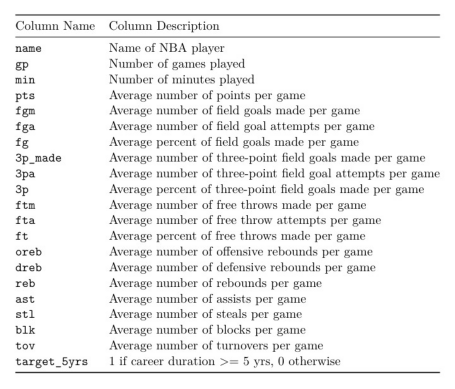

In [18]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

# upload imagen
img = mpimg.imread('/content/i1.jpg')

# Show imagen
plt.imshow(img)
plt.axis('off') # Hide the axes
plt.show()

**Question:** Which columns would you select and avoid selecting as features, and why? Keep in mind the goal is to identify features that will serve as useful predictors for the target variable, target_5yrs.

Identification or demographics columns should be avoided to make predictions, the important things come from tendency, not from individuals. Maybe gp and pts are the best option to predict career duration, but also the min could help. Combining pts with min we can create a new feature, per example, as player efficiency. Also, fg could hep because is a relation between 1 player and the others, similar story with 3p_made and ftm. The variable reb involves offensive and defensive rebounds, so, it offers more information, performance variables like ast, stl, blocks and tov could help too.

As summarize gp, min, pts, fg, 3p, ft, reb, ast, stl, blk, tov seem to be the best option.

 **Next**, select the columns you want to proceed with. Make sure to include the target column, target_5yrs. Display the first few rows to confirm they are as expected.


In [19]:
# Select the columns to proceed with and save the DataFrame in new variable `selected_data`.
# Include the target column, `target_5yrs`.
selected_data = data[["gp", "min", "pts", "fg", "3p", "ft", "reb", "ast", "stl", "blk", "tov", "target_5yrs"]]

# Display the first few rows.
selected_data.head()

,gp,min,pts,fg,3p,ft,reb,ast,stl,blk,tov,target_5yrs
0,36,27.4,7.4,34.7,25.0,69.9,4.1,1.9,0.4,0.4,1.3,0
1,35,26.9,7.2,29.6,23.5,76.5,2.4,3.7,1.1,0.5,1.6,0
2,74,15.3,5.2,42.2,24.4,67.0,2.2,1.0,0.5,0.3,1.0,0
3,58,11.6,5.7,42.6,22.6,68.9,1.9,0.8,0.6,0.1,1.0,1
4,48,11.5,4.5,52.4,0.0,67.4,2.5,0.3,0.3,0.4,0.8,1


An important aspect of feature transformation is feature encoding. If there are categorical columns that you would want to use as features, those columns should be transformed to be numerical. This technique is also known as feature encoding.

**Question:** Why is feature transformation important to consider? Are there any transformations necessary for the features you want to use?

Most models work with numerical variables and not with categorical variables, so it is necessary to transform it, in this case selected features are numerical, so, it not necessary to change it into numerical.

**1.5.3 Feature extraction**

 Display the first few rows containing descriptions of the data for reference. The table is as follows:


**Question:** Which columns lend themselves to feature extraction?

 • The gp, pts, min columns lend themselves to feature extraction.
Exemplar response is total number of points earned by a player across games using gp and pts, it could be called total_points, also combined with min could show a measure of player efficiency appointing career duration.

Extract two features that you think would help predict target_5yrs. Then, create a new variable named ‘extracted_data’ that contains features from ‘selected_data’, as well as the features being extracted


In [20]:
# Extract two features that would help predict target_5yrs.
# Create a new variable named `extracted_data`.
# Make a copy of `selected_data`
extracted_data = selected_data.copy()

# Add a new column named `total_points`;
# Calculate total points earned by multiplying the number of games played by the average number of points earned per game
extracted_data["total_points"] = extracted_data["gp"] * extracted_data["pts"]

# Add a new column named `efficiency`. Calculate efficiency by dividing the total points earned by the total number
# of minutes played, which yields points per minute. (Note that `min` represents avg. minutes per game.)
extracted_data["efficiency"] = extracted_data["total_points"] / (extracted_data["min"] * extracted_data["gp"])

# Display the first few rows of `extracted_data` to confirm that the new columns were added.
extracted_data.head()

,gp,min,pts,fg,3p,ft,reb,ast,stl,blk,tov,target_5yrs,total_points,efficiency
0,36,27.4,7.4,34.7,25.0,69.9,4.1,1.9,0.4,0.4,1.3,0,266.4,0.270073
1,35,26.9,7.2,29.6,23.5,76.5,2.4,3.7,1.1,0.5,1.6,0,252.0,0.267658
2,74,15.3,5.2,42.2,24.4,67.0,2.2,1.0,0.5,0.3,1.0,0,384.8,0.339869
3,58,11.6,5.7,42.6,22.6,68.9,1.9,0.8,0.6,0.1,1.0,1,330.6,0.491379
4,48,11.5,4.5,52.4,0.0,67.4,2.5,0.3,0.3,0.4,0.8,1,216.0,0.391304


Now, to prepare for the Naive Bayes model that you will build in a later lab, clean the extracted data and ensure ensure it is concise. Naive Bayes involves an assumption that features are independent of each other given the class. In order to satisfy that criteria, if certain features are aggregated to yield new features, it may be necessary to remove those original features. Therefore, drop the columns that were used to extract new features.

 Note: There are other types of models that do not involve independence assumptions, so this would not be required in those instances. In fact, keeping the original features may be beneficial.


In [21]:
# Remove any columns from `extracted_data` that are no longer needed.
# Remove `gp`, `pts`, and `min` from `extracted_data`.
extracted_data = extracted_data.drop(columns=["gp", "pts", "min"])

# Display the first few rows of `extracted_data` to ensure that column drops took place.
extracted_data.head()

,fg,3p,ft,reb,ast,stl,blk,tov,target_5yrs,total_points,efficiency
0,34.7,25.0,69.9,4.1,1.9,0.4,0.4,1.3,0,266.4,0.270073
1,29.6,23.5,76.5,2.4,3.7,1.1,0.5,1.6,0,252.0,0.267658
2,42.2,24.4,67.0,2.2,1.0,0.5,0.3,1.0,0,384.8,0.339869
3,42.6,22.6,68.9,1.9,0.8,0.6,0.1,1.0,1,330.6,0.491379
4,52.4,0.0,67.4,2.5,0.3,0.3,0.4,0.8,1,216.0,0.391304


Next, export the extracted data as a new .csv file. You will use this in a later lab.

In [22]:
# Export the extracted data.
extracted_data.to_csv("extracted_nba_players_data.csv", index=0)

# Export in Colab
from google.colab import files

# Convert dataframe in a CSV file
extracted_data.to_csv('extracted_nba_players_data.csv', index=False)

# Download CSV dataframe
files.download('extracted_nba_players_data.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Also, pass in the parameter `index` set to `0`, so that when the export occurs, the row indices from the DataFrame are not treated as an additional column in the resulting file.

** 1.6 Considerations** Exemplar response

 What are some key takeaways that you learned during this lab?- It is important to check for class balance in a dataset, particularly in the context of feature engineering and predictive modeling. If the target column in a dataset has more than 90% of its values belonging to one class, it is recommended to redistribute the data; otherwise, once a model is trained on the imbalanced data and predictions are made, the predictions may be biased.- Feature selection involves choosing features that help predict the target variable and removing columns that may not be helpful for prediction. In this process, and throughout feature engineering, it is important to make ethical considerations.

- Feature transformation involves transforming features so that they are more usable for future modeling purposes, which includes encoding categorical features to turn them into numerical features.

- Feature extraction involves combining existing columns meaningfully to construct new features that would help improve prediction.

 What summary would you provide to stakeholders? Consider key attributes to be shared from the data, as well as upcoming project plans.- The following attributes about player performance could help predict their NBA career duration and should be included in a presentation to stakeholders: field goals, three-point field goals, free throws, rebounds, assists, steals, blocks, turnovers, total points, and efficiency as points per minute.- It would be important to explain that these attributes, along with a relevant dataset, will be used in the next stage of the project. At that point, a model will be built to predict a player’s career duration. Insights gained will be shared with stakeholders once the project is complete. Stakeholders would also appreciate being provided with a timeline and key deliverables that they can expect to receive.


# Naive Bayes model

## Dataset I

**1 Naive Bayes**

 Throughout the following exercises, you will learn to use Python to construct and test a Naive Bayes model with scikit-learn. Before starting on this programming exercise, we strongly recommend watching the video lecture and completing the IVQ for the associated topics.
 All the information you need for solving this assignment is in this notebook, and all the code you will be implementing will take place within this notebook.

 Topics of focus include:

 • Relevant import statements

 • Stratification during data splitting

 • Fitting a Naive Bayes model

 • Evaluating the model on test data

 As we move forward, you can find instructions on how to install required libraries as they arise in this notebook.

** 1.1 Modeling objective**

 The modeling objective is to build and test a Naive Bayes model that uses banking data to predict whether a customer will churn. If a customer churns, it means they left the bank and took their business elsewhere. If we can predict customers who are likely to churn, we can take measures to retain them before they do. These measures could be promotions, discounts, or other incentives to boost customer satisfaction and, therefore, retention.

** 1.1.1 Target variable**
 Remember, our target variable is called Exited. This is a Boolean value that indicates whether or not a customer left the bank (0 = did not leave, 1 = did leave). For each customer, our model will predict whether they should have a 0 or a 1 in the Exited column.

**1.1.2 IMPORTANT: Model design**

 This is a classification task, because we are trying to predict on a binary class. Naive Bayes often works well for this kind of task. However, recall that there are several different implementations of the Naive Bayes algorithm in scikit-learn, and each assumes that all of your predictor variables are of a single type (e.g., Gaussian for continuous variables, Bernoulli for binary variables, etc.).

 Our data has all different types of predictor variables! As a data professional, one of the first things you’ll learn on the job is that real-world data is never perfect. Sometimes the data breaks the assumptions of your model. In practice, you’ll have to do the best you can with what you have.

In this case, if we wanted to build the best possible Naive Bayes model, we’d treat each variable according to their different types and distributions, and then combine each conditional probability to get the final prediction for each observation. That’s advanced data science, and beyond the scope of this course.

 For this lesson, we’re going to use the GaussianNB classifier. This implementation assumes that all of your variables are continuous and that they have a Gaussian (i.e., normal) distribution. Our data doesn’t perfectly adhere to these assumptions, but a Gaussian model may still yield usable results, even with imperfect data.

**1.2 Import statements**

 Before we begin with the exercises and analyzing the data, we need to import all libraries and extensions required for this programming exercise. Throughout the course, we will be using numpy and pandas for operations, and matplotlib for plotting. Notice that we’re getting GaussianNB from the sklearn.naive_bayes module. If you wanted, you could get the other implementations of Naive Bayes from this same module. Refer to the documentation for details.

 We’ll also import some evaluation metrics from sklearn.metrics and some functions that will help us generate and plot a confusion matrix.


In [23]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import recall_score, precision_score, f1_score, accuracy_score
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

**1.3 Read in the data**

 We’re going to use the prepared dataframe that we made in the previous notebook. Remember, we:

• Dropped the RowNumber, CustomerId, Surname, and Gender columns

 • Dummy encoded the Geography column to convert categorical to Boolean

 • Engineered a new feature called Loyalty, by dividing each customer’s tenure by their age


In [24]:
churn_df = pd.read_csv('/content/churn_df.csv')
churn_df.head(5)

,CreditScore,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited,Loyalty,Geography_Germany,Geography_Spain
0,619,42,2,0.00,1,1,1,101348.88,1,0.047619,False,False
1,608,41,1,83807.86,1,0,1,112542.58,0,0.024390,False,True
2,502,42,8,159660.80,3,1,0,113931.57,1,0.190476,False,False
3,699,39,1,0.00,2,0,0,93826.63,0,0.025641,False,False
4,850,43,2,125510.82,1,1,1,79084.10,0,0.046512,False,True


1.4 Check the class balance

Before we begin modeling, let’s do a few more things. First, we’ll check the class balance of the
 Exited column, our target variable.

In [25]:
# Check class balance
churn_df['Exited'].value_counts()

,count
Exited,
0,7963
1,2037


The class is split roughly 80/20. In other words, ~20% of the people in this dataset churned. This is an unbalanced dataset, but it’s not extreme.

 Also, remember that the Naive Bayes formula depends on class priors (P(c)) to make predictions. Because of this, performing class balancing (e.g., upsampling or downsampling) would change those terms in a way that would no longer reflect the real-world distribution of the data.

 For these reasons, we’ll proceed without altering the class balance of our target variable.

**1.5 Drop dependent variables**

Remember that Naive Bayes models operate best when there’s conditional independence between the predictor variables. When we prepared our data, we engineered a feature called Loyalty by dividing Tenure by Age. Because this new feature is just the quotient of two existing variables, it’s no longer conditionally independent. Therefore, we’ll drop Tenure and Age to help adhere to the assumptions of our model.


In [26]:
# Drop Tenure and Age variables
churn_df = churn_df.drop(['Tenure', 'Age'], axis=1)
churn_df.head()

,CreditScore,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited,Loyalty,Geography_Germany,Geography_Spain
0,619,0.00,1,1,1,101348.88,1,0.047619,False,False
1,608,83807.86,1,0,1,112542.58,0,0.024390,False,True
2,502,159660.80,3,1,0,113931.57,1,0.190476,False,False
3,699,0.00,2,0,0,93826.63,0,0.025641,False,False
4,850,125510.82,1,1,1,79084.10,0,0.046512,False,True


**1.6 Split the data**

We’ve prepared our data and we’re ready to model. There’s one last step before we can begin. We must split the data into features and target variable, and into training data and test data. We do this using the train_test_split() function. We’ll put 25% of the data into our test set, and use the remaining 75% to train the model.

 Notice below that we include the argument stratify=y. If our master data has a class split of 80/20, stratifying ensures that this proportion is maintained in both the training and test data. =y tells the function that it should use the class ratio found in the y variable (our target).

 The less data you have overall, and the greater your class imbalance, the more important it is to stratify when you split the data. If we didn’t stratify, then the function would split the data randomly, and we could get an unlucky split that doesn’t get any of the minority class in the test data, which means we wouldn’t be able to effectively evaluate our model. Worst of all, we might not even realize what went wrong without doing some detective work.

 Lastly, we set a random seed so we and others can reproduce our work.


In [27]:
# Define the y (target) variable
y = churn_df['Exited']

# Define the X (predictor) variables
X = churn_df.copy()
X = X.drop('Exited', axis=1)

# Split into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, \
stratify=y, random_state=42)

**1.7 Modeling**

 **1.7.1 1. Unscaled data**

 We’re finally ready to model! Just as with linear and logistic regression, our modeling process will begin with fitting our model to the training data, and then using the model to make predictions on the test data.


In [28]:
# Fit the model
gnb = GaussianNB()
gnb.fit(X_train, y_train)

# Get the predictions on test data
y_preds = gnb.predict(X_test)

Now we can check how our model performs using the evaluation metrics we imported.

In [29]:
print('Accuracy:', '%.3f' % accuracy_score(y_test, y_preds))
print('Precision:', '%.3f' % precision_score(y_test, y_preds))
print('Recall:', '%.3f' % recall_score(y_test, y_preds))
print('F1 Score:', '%.3f' % f1_score(y_test, y_preds))

Accuracy: 0.796
Precision: 0.000
Recall: 0.000
F1 Score: 0.000


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Hmm… this isn’t very good. Our precision, recall, and F1 scores are all zero. What’s going on? Well, let’s consider our precision formula:

precision = true positives / (false positives + true positive)

There are two ways for the model to have a precision of zero. The first is if the numerator is zero, which would mean that our model didn’t predict any true positives.

 The second is if the denominator is also zero, which would mean that our model didn’t predict any positives at all. Dividing by zero results in an undefined value, but scikit-learn will return a value of zero in this case. Depending on your modeling environment, you may get a warning that tells you there’s a denominator of zero.

We don’t have a warning, so let’s check which situation is occurring here. If we call np.unique() on the model’s predictions and it doesn’t return an array containing [0, 1], we’ll know it’s not predicticting any churned customers.

In [30]:
# Check unique values in predictions
np.unique(y_preds)

array([0])

This confirms that the model predicted 0 (not churned) for every sample in the test data.

 Consider why this might be. Perhaps we did something wrong in our modeling process, or maybe using GaussianNB on predictor variables of different types and distributions just doesn’t make a good model. Maybe there were problems with the data.

 Before we give up, maybe the data can give us some insight into what might be happening or what further steps we can take. Let’s use describe() to inspect the X data.


In [31]:
# Get descriptive stats for data
X.describe()

,CreditScore,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Loyalty
count,10000.000000,10000.000000,10000.000000,10000.00000,10000.000000,10000.000000,10000.000000
mean,650.528800,76485.889288,1.530200,0.70550,0.515100,100090.239881,0.137936
std,96.653299,62397.405202,0.581654,0.45584,0.499797,57510.492818,0.089506
min,350.000000,0.000000,1.000000,0.00000,0.000000,11.580000,0.000000
25%,584.000000,0.000000,1.000000,0.00000,0.000000,51002.110000,0.064516
50%,652.000000,97198.540000,1.000000,1.00000,1.000000,100193.915000,0.129032
75%,718.000000,127644.240000,2.000000,1.00000,1.000000,149388.247500,0.200000
max,850.000000,250898.090000,4.000000,1.00000,1.000000,199992.480000,0.555556


Something that stands out is that the Loyalty variable we created is on a vastly different scale than some of the other variables we have, such as Balance or EstimatedSalary. The maximum value of Loyalty is 0.56, while the maximum for Balance is over 250,000—almost six orders of magnitude greater!

**1.7.2 2. Scaled data**

 One thing that you can usually try when modeling is scaling your predictor variables. Some models require you to scale the data in order for them to operate as expected, others don’t. Naive Bayes does not require data scaling. However, sometimes packages and libraries need to make assumptions and approximations in their calculations. We’re already breaking some of these assumptions by using the GaussianNB classifier on this dataset, and it may not be helping that some of our predictor variables are on very different scales. In general, scaling might not improve the model, but it probably won’t make it worse. Let’s try scaling our data.

We’ll use a function called MinMaxScaler, which we’ll import from the sklearn.preprocessing module. MinMaxScaler normalizes each column so every value falls in the range of [0, 1]. The column’s maximum value would scale to 1, and its minimum value would scale to 0. Everything else would fall somewhere between. This is the formula:

Xscaled = (X - Xmin) / (Xmax - Xmin)

To use a scaler, you must fit it to the training data, and transform both the training data and the test data using that same scaler.

 Let’s apply this and retrain the model.


In [32]:
# Import the scaler function
from sklearn.preprocessing import MinMaxScaler

# Instantiate the scaler
scaler = MinMaxScaler()

# Fit the scaler to the training data
scaler.fit(X_train)

# Scale the training data
X_train = scaler.transform(X_train)

# Scale the test data
X_test = scaler.transform(X_test)

Now we’ll repeat the steps to fit our model, only this time we’ll fit it to our new scaled data.

In [33]:
# Fit the model
gnb_scaled = GaussianNB()
gnb_scaled.fit(X_train, y_train)

# Get the predictions on test data
scaled_preds = gnb_scaled.predict(X_test)

In [34]:
print('Accuracy:', '%.3f' % accuracy_score(y_test, scaled_preds))
print('Precision:', '%.3f' % precision_score(y_test,scaled_preds))
print('Recall:', '%.3f' % recall_score(y_test, scaled_preds))
print('F1 Score:', '%.3f' % f1_score(y_test, scaled_preds))

Accuracy: 0.806
Precision: 0.544
Recall: 0.303
F1 Score: 0.389


It works now! The model is far from perfect, but at least it’s predicting churned customers now.

 **1.8 Evaluation**

 Let’s examine more closely how our model classified the test data. We’ll do this with a confusion matrix. Recall that a confusion matrix is a graphic that shows your models true and false positives, and true and false negatives. We can do this using the ConfusionMatrixDisplay and confusion_matrix functions that we imported.

 Here’s a helper function that will allow us to plot a confusion matrix for our model.


In [35]:
def conf_matrix_plot(model, x_data, y_data):
 '''
 Accepts as argument model object, X data (test or validate), and y data (test or validate).
 Return a plot of confusion matrix for predictions on y data.
 '''
 model_pred = model.predict(x_data)
 cm = confusion_matrix(y_data, model_pred, labels=model.classes_)
 disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=model.classes_,)
 disp.plot(values_format='') # `values_format=''` suppresses scientific notation
 plt.show()

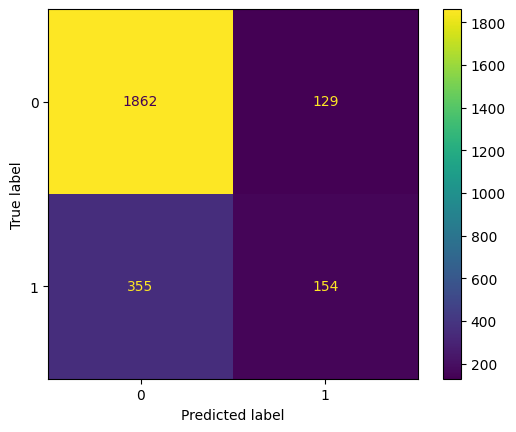

In [36]:
conf_matrix_plot(gnb_scaled, X_test, y_test)

All of our model metrics can be derived from the confusion matrix, and each metric tells its own
 part of the story. What stands out most in the confusion matrix is that the model misses a lot of
 customers who will churn. In other words, there are a lot of false negatives—355, to be exact. This
 is why our recall score is only 0.303.
 Would weuse this model? It depends. For one thing, we’d certainly want to develop other models to
 see if they perform better. Later, you’ll learn how to develop other classification models. You’ll also
 learn more about evaluating your models, which takes careful decision-making and consideration
 for your use case.

## Dataset II

**1.1 Introduction**

 In this activity, you will build your own Naive Bayes model. Naive Bayes models can be valuable
 to use any time you are doing work with predictions because they give you a way to account for
 new information. In today’s world, where data is constantly evolving, modeling with Naive Bayes
 can help you adapt quickly and make more accurate predictions about what could occur.

 For this activity, you work for a firm that provides insights for management and coaches in the
 National Basketball Association (NBA), a professional basketball league in North America. The
 league is interested in retaining players who can last in the high-pressure environment of professional
 basketball and help the team be successful over time. In the previous activity, you analyzed a subset
 of data that contained information about the NBA players and their performance records. You
 conducted feature engineering to determine which features would most effectively predict a player’s
 career duration. You will now use those insights to build a model that predicts whether a player
 will have an NBA career lasting five years or more.

 The data for this activity consists of performance statistics from each player’s rookie year. There
 are 1,341 observations, and each observation in the data represents a different player in the NBA.
 Your target variable is a Boolean value that indicates whether a given player will last in the league
 for five years. Since you previously performed feature engineering on this data, it is now ready for
 modeling.

 **1.2 Step 1: Imports**

 **1.2.1 Import packages**

 Begin with your import statements. Of particular note here are pandas and from sklearn,
 naive_bayes, model_selection, and metrics.


In [37]:
# Import relevant libraries and modules.
import pandas as pd
from sklearn import naive_bayes
from sklearn import model_selection
from sklearn import metrics

**1.2.2 Load the dataset**

 Recall that in the lab about feature engineering, you outputted features for the NBA player
 dataset along with the target variable target_5yrs. Data was imported as a DataFrame called
 extracted_data. As shown in this cell, the dataset has been automatically loaded in for you. You
 do not need to download the .csv file, or provide more code, in order to access the dataset and
 proceed with this lab. Please continue with this activity by completing the following instructions.

In [38]:
# RUN THIS CELL TO IMPORT YOUR DATA.
# Load extracted_nba_players_data.csv into a DataFrame called extracted_data.
extracted_data = pd.read_csv('extracted_nba_players_data.csv')

**1.2.3 Display the data**

Review the first 10 rows of data.

In [39]:
# Display the first 10 rows of data.
extracted_data.head(10)

,fg,3p,ft,reb,ast,stl,blk,tov,target_5yrs,total_points,efficiency
0,34.7,25.0,69.9,4.1,1.9,0.4,0.4,1.3,0,266.4,0.270073
1,29.6,23.5,76.5,2.4,3.7,1.1,0.5,1.6,0,252.0,0.267658
2,42.2,24.4,67.0,2.2,1.0,0.5,0.3,1.0,0,384.8,0.339869
3,42.6,22.6,68.9,1.9,0.8,0.6,0.1,1.0,1,330.6,0.491379
4,52.4,0.0,67.4,2.5,0.3,0.3,0.4,0.8,1,216.0,0.391304
5,42.3,32.5,73.2,0.8,1.8,0.4,0.0,0.7,0,277.5,0.324561
6,43.5,50.0,81.1,2.0,0.6,0.2,0.1,0.7,1,409.2,0.605505
7,41.5,30.0,87.5,1.7,0.2,0.2,0.1,0.7,1,273.6,0.553398
8,39.2,23.3,71.4,0.8,2.3,0.3,0.0,1.1,0,156.0,0.242424
9,38.3,21.4,67.8,1.1,0.3,0.2,0.0,0.7,0,155.4,0.435294


**1.3 Step 2: Model preparation**

**1.3.1 Isolate your target and predictor variables**

Separately define the target variable (target_5yrs) and the features.

In [40]:
# Define the y (target) variable.
y = extracted_data['target_5yrs']
# Define the X (predictor) variables.
X = extracted_data.drop('target_5yrs', axis = 1)

**1.3.2 Display the first 10 rows of your target data**

 Display the first 10 rows of your target and predictor variables. This will help you get a sense of
 how the data is structured.

In [41]:
# Display the first 10 rows of your target data.
y.head(10)

,target_5yrs
0,0
1,0
2,0
3,1
4,1
5,0
6,1
7,1
8,0
9,0


 **Question:** What do you observe about the your target variable?
 Given that the target variable contains both 1 and 0 indicates that it is binary and requires a model
 suitable for binary classification.

In [42]:
# Display the first 10 rows of your predictor variables.
X.head(10)

,fg,3p,ft,reb,ast,stl,blk,tov,total_points,efficiency
0,34.7,25.0,69.9,4.1,1.9,0.4,0.4,1.3,266.4,0.270073
1,29.6,23.5,76.5,2.4,3.7,1.1,0.5,1.6,252.0,0.267658
2,42.2,24.4,67.0,2.2,1.0,0.5,0.3,1.0,384.8,0.339869
3,42.6,22.6,68.9,1.9,0.8,0.6,0.1,1.0,330.6,0.491379
4,52.4,0.0,67.4,2.5,0.3,0.3,0.4,0.8,216.0,0.391304
5,42.3,32.5,73.2,0.8,1.8,0.4,0.0,0.7,277.5,0.324561
6,43.5,50.0,81.1,2.0,0.6,0.2,0.1,0.7,409.2,0.605505
7,41.5,30.0,87.5,1.7,0.2,0.2,0.1,0.7,273.6,0.553398
8,39.2,23.3,71.4,0.8,2.3,0.3,0.0,1.1,156.0,0.242424
9,38.3,21.4,67.8,1.1,0.3,0.2,0.0,0.7,155.4,0.435294


**Question:** What do you observe about the your predictor variables?

The data indicates that all of the predictor variables are continuous numerical values, so it is
 important that the model selected is suitable for continuous features.

 **1.3.3 Perform a split operation on your data**

 Divide your data into a training set (75% of data) and test set (25% of data). This is an important
 step in the process, as it allows you to reserve a part of the data that the model has not observed.
 This tests how well the model generalizes—or performs—on new data.

In [43]:
# Perform the split operation on your data.
# Assign the outputs as follows: X_train, X_test, y_train, y_test.
X_train, X_test, y_train, y_test = model_selection.train_test_split(X, y, test_size=0.25, random_state=0)

 **1.3.4 Print the shape of each output**

 Print the shape of each output from your train-test split. This will verify that the split operated
 as expected.

In [44]:
# Print the shape (rows, columns) of the output from the train-test split.
# Print the shape of X_train.
print(X_train.shape)

# Print the shape of X_test.
print(X_test.shape)

# Print the shape of y_train.
print(y_train.shape)

# Print the shape of y_test.
print(y_test.shape)

(1005, 10)
(335, 10)
(1005,)
(335,)


**Question:** How many rows are in each of the outputs?

 Each training DataFrame contains 1,005 rows, while each test DataFrame contains 335 rows. Ad
ditionally, there are 10 columns in each X DataFrame, with only one column in each y DataFrame.

**Question:** What was the effect of the train-test split?
 The effect of the train-test split showed an approximately 75% training and 25% test split.


 **1.4 Step 3: Model building**

 **Question:** Which Naive Bayes algorithm should you use?

 Using the assumption that your features are normally distributed and continuous, the Gaussian
 Naive Bayes algorithm is most appropriate for your data. While your data may not perfectly adhere
 to these assumptions, this model will still yield the most usable and accurate results.

 **1.4.1 Fit your model to your training data and predict on your test data**

 By creating your model, you will be drawing on your feature engineering work by training the
 classifier on the X_train DataFrame. You will use this to predict target_5yrs from y_train.
 Start by defining nb to be the relevant algorithm from sklearn.naive_bayes. Then fit your model
 to your training data. Use this fitted model to create predictions for your test data.


In [45]:
# Assign `nb` to be the appropriate implementation of Naive Bayes.
nb = naive_bayes.GaussianNB()

# Fit the model on your training data.
nb.fit(X_train, y_train)

# Apply your model to predict on your test data. Call this "y_pred".
y_pred = nb.predict(X_test)

**1.5 Step 4: Results and evaluation**

**1.5.1 Leverage metrics to evaluate your model’s performance**

 To evaluate the data yielded from your model, you can leverage a series of metrics and evaluation
 techniques from scikit-learn by examining the actual observed values in the test set relative to your
 model’s prediction. Specifically, print the accuracy score, precision score, recall score, and f1 score
 associated with your test data and predicted values.

In [46]:
# Print your accuracy score.
print('accuracy score:'), print(metrics.accuracy_score(y_test, y_pred))

# Print your precision score.
# Print your recall score.
print('precision score:'), print(metrics.precision_score(y_test, y_pred))
print('recall score:'), print(metrics.recall_score(y_test, y_pred))

# Print your f1 score.
print('f1 score:'), print(metrics.f1_score(y_test, y_pred))

accuracy score:
0.6895522388059702
precision score:
0.8405797101449275
recall score:
0.5858585858585859
f1 score:
0.6904761904761905


(None, None)

 **Question:** What is the accuracy score for your model, and what does this tell you about the
 success of the model’s performance?
 The accuracy score for this model is 0.6896, or 69.0% accurate.

 **Question:** Can you evaluate the success of your model by using the accuracy score exclusively?
 In classification problems, accuracy is useful to know but may not be the best metric by which
 to evaluate this model. While accuracy is often the most intuitive metric, it is a poor evaluation
 metric in some cases. In particular, if you have imbalanced classes, a model could appear accurate
 but be poor at balancing false positives and false negatives.

 **Question:** What are the precision and recall scores for your model, and what do they mean? Is
 one of these scores more accurate than the other?
 Precision and recall scores are both useful to evaluate the correct predictive capability of a model
 because they balance the false positives and false negatives inherent in prediction.
 The model shows a precision score of 0.8406, suggesting the model is quite good at predicting true
 positives—meaning the player will play longer than five years—while balancing false positives. The
 recall score of 0.5859 shows worse performance in predicting true negatives—where the player will
 not play for five years or more—while balancing false negatives.These two metrics combined can
 give a better assessment of model performance than accuracy does alone.

 **Question:** What is the F1 score of your model, and what does this score mean?
 The F1 score balances the precision and recall performance to give a combined assessment of how
 well this model delivers predictions. In this case, the F1 score is 0.6905, which suggests reasonable
 predictive power in this model.

 **1.5.2 Gain clarity with the confusion matrix**

 Recall that a confusion matrix is a graphic that shows your model’s true and false positives and
 negatives. It helps to create a visual representation of the components feeding into the metrics.
 Create a confusion matrix based on your predicted values for the test set.

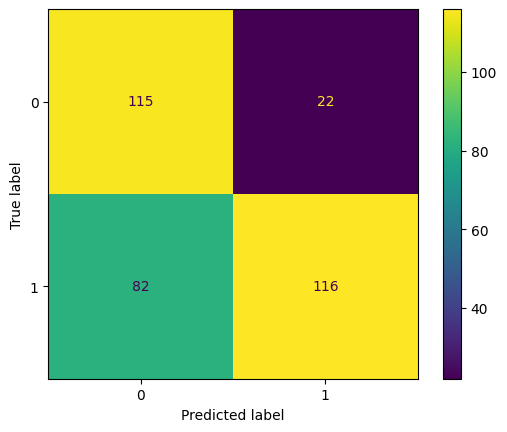

In [47]:
# Construct and display your confusion matrix.
# Construct the confusion matrix for your predicted and test values.
cm = metrics.confusion_matrix(y_test, y_pred)

# Create the display for your confusion matrix.
# Plot the visual in-line.
disp = metrics.ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=nb.classes_)
disp.plot()

 **Question:** What do you notice when observing your confusion matrix, and does this correlate to
 any of your other calculations?
    • The top left to bottom right diagonal in the confusion matrix represents the correct predictions, and the ratio of these squares showcases the accuracy.
    • The concentration of true positives stands out relative to false positives. This ratio is why the precision score is so high (0.8406).
    • True negatives and false negatives are closer in number, which explains the worse recall score.

 **1.6 Considerations**

 **What are some key takeaways that you learned from this lab?**

 - The evaluation of the
 model is important to inform if the model has delivered accurate predictions.- Splitting the data
 was important for ensuring that there was new data for the model to test its predictive performance.- Each metric provided an evaluation from a different standpoint, and accuracy alone was not a
 strong way to evaluate the model.- Effective assessments balance the true/false positives versus
 true/false negatives through the confusion matrix and F1 score.

 **How would you present your results to your team?**

 - Showcase the data used to create the
 prediction and the performance of the model overall.- Review the sample output of the features
 and the confusion matrix to indicate the model’s performance.- Highlight the metric values,
 emphasizing the F1 score.

 **How would you summarize your findings to stakeholders?** - The model created provides
 some value in predicting an NBA player’s chances of playing for five years or more.- Notably, the
 model performed better at predicting true positives than it did at predicting true negatives. In
 other words, it more accurately identified those players who will likely play for more than five years
 than it did those who likely will not.

# K-means for color compression

 **1 Using K-means for color compression**

 Note that this notebook is intended as a demonstrative example of how the K-means algorithm
 works. Its focus is on the theory and results of its application, not on the code itself (which you
 will learn later). As such, it differs from other notebooks that accompany video lessons.
 Specifically, some of the steps in the code exceed the scope of what is taught in the lessons. Pay
 attention to the cells’ output, and not so much to the code that generates it.

 This lab will:
    • Give you a worked example of K-means on non-synthetic data
    • Reinforce your understanding of K-means’ underlying theory by demonstrating its affect when applied to a photograph

 Before starting on this programming exercise, we strongly recommend watching the video lecture
 and completing the IVQ for the associated topics.

 As we move forward, you can find instructions on how to install required libraries as they arise in
 this notebook.

 **1.1 Modeling objective**

 We will use K-means to cluster the pixels of a photograph of some tulips based on their encoded
 color values. We will explore how different values of k affect the clustering of the pixels, and thus
 the appearance of the photograph. We will also examine what is happening “under the hood” as
 the algorithm executes.
 NOTE: This notebook contains interactive plots that must be generated each time
 the notebook is opened. To ensure that the plots display, navigate to “Kernel” in the
 menu at the top of the notebook and click “Restart & Run All” from the dropdown
 menu.

 **1.2 Import statements**
 We will be using numpy and pandas for operations, and Plotly for 3-D visualization. Of particular
 note is Kmeans, which is scikit-learn’s implementation of the K-means algorithm.

In [48]:
import numpy as np
import pandas as pd

%pylab inline
import plotly.graph_objects as go

from sklearn.cluster import KMeans

Populating the interactive namespace from numpy and matplotlib


/usr/local/lib/python3.11/dist-packages/IPython/core/magics/pylab.py:159: UserWarning: pylab import has clobbered these variables: ['cm']
`%matplotlib` prevents importing * from pylab and numpy
  warn("pylab import has clobbered these variables: %s"  % clobbered +


Populating the interactive namespace from numpy and matplotlib

 **1.3 Read in data**

 The “data” in this case is not a pandas dataframe. It’s a photograph, which we’ll convert into a
 numerical array.

(398, 298, 3)


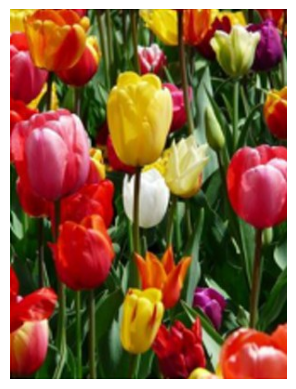

In [49]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

# upload imagen
img = mpimg.imread('/content/img2.jpg')

# Show imagen
print(img.shape)
plt.imshow(img)
plt.axis('off') # Hide the axes
plt.show()

Here we have a photograph of some tulips. The shape of the image is 320 x 240 x 3. This can
 be interpreted as pixel information. Each dot on your screen is a pixel. This photograph has 320

vertical pixels and 240 horizontal pixels.
 But what is the third dimension of “3”? This dimension refers to the values that encode the color
 of each pixel. Each pixel has 3 parameters: red (R), green (G), and blue (B), also known as its
 RGB values. For each color—R, G, and B—the encoded value can range from 0-255. This means
 that there are 256³, or 16,777,216 different combinations of RGB, each resulting in a unique color
 on your screen.
 To prepare this data for modeling, we’ll reshape it into an array, where each row represents a single
 pixel’s RGB color values.

In [50]:
# Reshape the image so that each row represents a single pixel
# defined by three values: R, G, B
img_flat = img.reshape(img.shape[0]*img.shape[1], 3)
img_flat[:5, :]

array([[209, 197,  23],
       [202, 189,  14],
       [200, 179,   2],
       [199, 172,   0],
       [200, 167,   0]], dtype=uint8)

In [51]:
img_flat.shape

(118604, 3)

 **1.4 Plot the data in 3-D space**

 Now we have an array as you can see in .shape. Each row is a single pixel’s color values. Because we have
 only 3 columns, we can visualize this data in 3-dimensional space. Let’s create a pandas dataframe
 to help us understand and visualize our data.

In [52]:
# Create a pandas df with r, g, and b as columns
img_flat_df = pd.DataFrame(img_flat, columns = ['r', 'g', 'b'])
img_flat_df.head()

,r,g,b
0,209,197,23
1,202,189,14
2,200,179,2
3,199,172,0
4,200,167,0


**Note:** The following cell’s output is viewable in two ways: You can re-run this cell, or manually
 convert the notebook to “Trusted.”

In [53]:
# Create 3D plot where each pixel in the `img` is displayed in its actual color
trace = go.Scatter3d(x = img_flat_df.r,
  y = img_flat_df.g,
  z = img_flat_df.b,
  mode='markers',
  marker=dict(size=1,
    color=['rgb({},{},{})'.format(r,g,b) for r,g,b
      in zip(img_flat_df.r.values,
        img_flat_df.g.values,
        img_flat_df.b.values)],
    opacity=0.5))

data = [trace]

layout = go.Layout(margin=dict(l=0,
                               r=0,
                               b=0,
                               t=0),
                               )

fig = go.Figure(data=data, layout=layout)
fig.update_layout(scene = dict(
                  xaxis_title='R',
                  yaxis_title='G',
                  zaxis_title='B'),
                  )
fig.show()

In this graph, each dot represents a color/pixel that is in our original image of tulips. The more
 intense the color, the more dots are concentrated in that area. The most-represented colors in the
 graph are the most abundant colors in the photograph: mostly reds, greens, and yellows. You can
 click and spin this graph to examine it from different angles. You can also zoom in and out.

We can train a K-means model on this data. The algorithm will create k clusters by minimizing
 the squared distances from each point to its nearest centroid.

Let’s first do an experiment. What would you expect to happen if we built a K-means model with
 just a single centroid (k = 1) and replaced each pixel in the photograph with the RGB value of
 that centroid? What would the photograph look like?
 Let’s try it.

**1.5 Cluster the data: k = 1**

In [54]:
# Instantiate the model
kmeans = KMeans(n_clusters=1, random_state=42).fit(img_flat)

In [55]:
# Copy `img_flat` so we can modify it
img_flat1 = img_flat.copy()

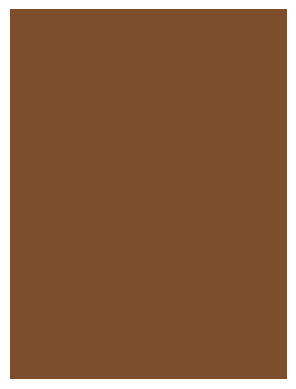

In [56]:
# Replace each row in the original image with its closest cluster center
for i in np.unique(kmeans.labels_):
  img_flat1[kmeans.labels_==i,:] = kmeans.cluster_centers_[i]

# Reshape the data back to (640, 480, 3)
img1 = img_flat1.reshape(img.shape)
plt.imshow(img1)
plt.axis('off');

So what happened? Well, let’s run through the K-means steps:
 1. We randomly placed our centroid in the colorspace.
 2. We assigned each point to its nearest centroid. Since there was only one centroid, all points
 were assigned to the same centroid, and thus to the same cluster.
 3. We updated the centroid’s location to the mean location of all of its points. Again, since
 there is only a single centroid, it updated to the mean location of every point in the image.
 4. Repeat until the model converges. In this case, it only took one iteration for the model to
 converge.

 We then updated each pixel’s RGB values to be the same as the centroid’s. The result is the image
 of our tulips when every pixel is replaced with the average color. The average color of this photo
 was brown —all the colors muddled together.
 Wecan verify this for ourselves by manually calculating the average for each column in the flattened
 array. This will give us the average R value, G value, and B value.

In [57]:
# Calculate mean of each column in the flattened array
column_means = img_flat.mean(axis=0)
print('column means: ', column_means)

column means:  [125.02886918  78.44597147  43.24775724]


Now, we can compare this to what the K-means model calculated as the final location of its one
 centroid.

In [58]:
print('cluster centers: ', kmeans.cluster_centers_)

cluster centers:  [[125.02886918  78.44597147  43.24775724]]


They’re the same! Now, let’s return to the 3-D rendering of our data, only this time we’ll add the
 centroid.

**Note:** The following cell’s output is viewable in two ways: You can re-run this cell, or manually
 convert the notebook to “Trusted.”

In [59]:
# Create 3-D plot where each pixel in the `img` is displayed in its actual color
trace = go.Scatter3d(x = img_flat_df.r,
 y = img_flat_df.g,
 z = img_flat_df.b,
 mode='markers',
 marker=dict(size=1,
   color=['rgb({},{},{})'.format(r,g,b) for
          r,g,b in zip(img_flat_df.r.values,
          img_flat_df.g.values,
          img_flat_df.b.values)],
          opacity=0.5))

data = [trace]

layout = go.Layout(margin=dict(l=0,
                               r=0,
                               b=0,
                               t=0))

fig = go.Figure(data=data, layout=layout)

# Add centroid to chart
centroid = kmeans.cluster_centers_[0].tolist()

fig.add_trace(
 go.Scatter3d(x = [centroid[0]],
              y = [centroid[1]],
              z = [centroid[2]],
              mode='markers',
              marker=dict(size=7,
                          color=['rgb(125.79706706,78.8178776,42.58090169)'],
                          opacity=1))
              )
fig.update_layout(scene = dict(
                  xaxis_title='R',
                  yaxis_title='G',
                  zaxis_title='B'),
                  )

fig.show()

 We can see the centroid as a large circle in the middle of the colorspace. (If you can’t, just click
 on the image and spin/zoom it.) Notice that this is the “center of gravity” of all the points in the
 graph.

 Now let’s try something else. Let’s refit a K-means model to the data, this time using k = 3. Take
 a moment to consider what you might expect to result from this. Go through the steps of what
 the model is doing like we did above. What colors are you likely to see?

 **1.6 Cluster the data: k = 3**

In [60]:
# Instantiate k-means model for 3 clusters
kmeans3 = KMeans(n_clusters=3, random_state=42).fit(img_flat)

# Check the unique values of what's returned by the .labels_ attribute
np.unique(kmeans3.labels_)

array([0, 1, 2], dtype=int32)

The .cluster_centers_ attribute returns an array where each element represents the coordinates
 of a centroid (i.e., their RGB values). We’ll use these coordinates as we did previously to generate
 the colors that are represented by our centroids.

In [61]:
# Assign centroid coordinates to `centers` variable
centers = kmeans3.cluster_centers_
centers

array([[176.47267422,  42.23776977,  27.90631161],
       [ 43.48802099,  52.70859808,  18.49592927],
       [201.99381401, 171.30356038, 107.0822737 ]])

Now we’ll create a helper function to easily display RGB values as color swatches, and use it to
 check the colors of the model’s centroids.

In [62]:
# Helper function that creates color swatches
def show_swatch(RGB_value):
  '''
  Takes in an RGB value and outputs a color swatch
  '''
  R, G, B = RGB_value
  rgb = [[np.array([R,G,B]).astype('uint8')]]
  plt.figure()
  plt.imshow(rgb)
  plt.axis('off');

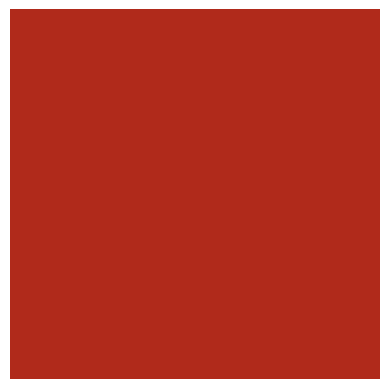

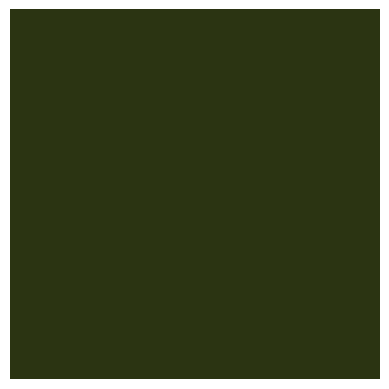

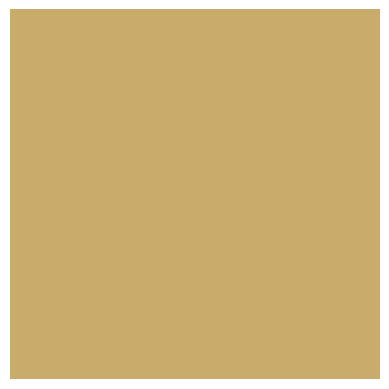

In [63]:
# Display the color swatches
for pixel in centers:
  show_swatch(pixel)

Hopefully, you hypothesized that we’d see similar colors as a result of a 3-cluster model. If you
 examine the original image of the tulips, it’s apparent that there are generally three dominant
 colors: reds, greens, and golds/yellows, which is very close to what the model returned.

 Just as before, let’s now replace each pixel in the original image with the RGB value of the centroid
 to which it was assigned.

In [64]:
# Helper function to display our photograph when clustered into k clusters
def cluster_image(k, img=img):
 '''
 Fits a K-means model to a photograph.
 Replaces photo's pixels with RGB values of model's centroids.
 Displays the updated image.
  Args:
    k: (int)- Your selected K-value
    img: (numpy array)- Your original image converted to a numpy array

 Returns:
  The output of plt.imshow(new_img), where new_img is a new numpy array \
  where each row of the original array has been replaced with the \
  coordinates of its nearest centroid.
 '''
 img_flat = img.reshape(img.shape[0]*img.shape[1], 3)
 kmeans = KMeans(n_clusters = k, random_state = 42).fit(img_flat)
 new_img = img_flat.copy()
 for i in np.unique(kmeans.labels_):
    new_img[kmeans.labels_ == i, :] = kmeans.cluster_centers_[i]
 new_img = new_img.reshape(img.shape)
 return plt.imshow(new_img.reshape(img.shape)), plt.axis('off');

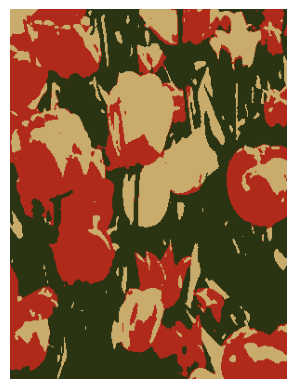

In [65]:
# Generate image when k=3
cluster_image(3);

We now have a photo with just three colors. Each pixel’s RGB values correspond to the values of
 its nearest centroid.

 We can return once more to our 3-D colorspace. This time, we’ll re-color each dot in the colorspace
 to correspond with the color of its centroid. This will allow us to see how the K-means algorithm
 clustered our data spatially.

 Again, don’t concern yourself so much with the code. Feel free to skip down to the graph.

In [66]:
# Just to get an understanding of what the data structures look like
print(kmeans3.labels_.shape)
print(kmeans3.labels_)
print(np.unique(kmeans3.labels_))
print(kmeans3.cluster_centers_)

(118604,)
[2 2 2 ... 0 0 0]
[0 1 2]
[[176.47267422  42.23776977  27.90631161]
 [ 43.48802099  52.70859808  18.49592927]
 [201.99381401 171.30356038 107.0822737 ]]


In [67]:
# Create a new column in the df that indicates the cluster number of each row
# (as assigned by Kmeans for k=3)
img_flat_df['cluster'] = kmeans3.labels_
img_flat_df.head()

,r,g,b,cluster
0,209,197,23,2
1,202,189,14,2
2,200,179,2,2
3,199,172,0,2
4,200,167,0,2


In [68]:
# Create helper dictionary to map RGB color values to each observation in df
series_conversion = {0: 'rgb({},{},{})'.format(*kmeans3.cluster_centers_[0].astype(int)),
                     1: 'rgb({},{},{})'.format(*kmeans3.cluster_centers_[1].astype(int)),
                     2: 'rgb({},{},{})'.format(*kmeans3.cluster_centers_[2].astype(int)),
                     }
series_conversion

{0: 'rgb(176,42,27)', 1: 'rgb(43,52,18)', 2: 'rgb(201,171,107)'}

In [69]:
# Replace the cluster numbers in the 'cluster' col with formatted RGB values
# (made ready for plotting)
img_flat_df['cluster'] = img_flat_df['cluster'].map(series_conversion)
img_flat_df.head()

,r,g,b,cluster
0,209,197,23,"rgb(201,171,107)"
1,202,189,14,"rgb(201,171,107)"
2,200,179,2,"rgb(201,171,107)"
3,199,172,0,"rgb(201,171,107)"
4,200,167,0,"rgb(201,171,107)"


In [70]:
# Replot the data, now showing which cluster (i.e., color) it was assigned to by K-means when k=3
trace = go.Scatter3d(x = img_flat_df.r,
                     y = img_flat_df.g,
                     z = img_flat_df.b,
                     mode='markers',
                     marker=dict(size=1,
                                 color=img_flat_df.cluster,
                                 opacity=1))

data = [trace] # Wrap the trace in a list

layout = go.Layout(margin=dict(l=0,
                               r=0,
                               b=0,
                               t=0))

fig = go.Figure(data=data, layout=layout)
fig.show()

You may be thinking to yourself that you would have clustered the data differently based on the
 distribution of points that you saw in the first 3-D plot. For example, why is there a sharp line
 that separates red and green, when there doesn’t appear to be any empty space there in the data?

 You’re not incorrect. Even though there’s no such thing as “wrong” clustering, some ways can
 definitely be better than others.
 You’ll notice in the original 3-D rendering that there are long bands—not round balls—of clustered
 data. K-means works best when the clusters are more circular, because it tries to minimize distance
 from point to centroid. It may be worth trying a different clustering algorithm if you want to cluster
 a long, narrow, continuous band of data. (More on these later!)

 Nonetheless, K-means successfully compresses the colors of this photograph. This process can be
 applied for any value of k. Here’s the output of each photo for k = 2–10.

 **1.7 Cluster the data: k = 2-10**

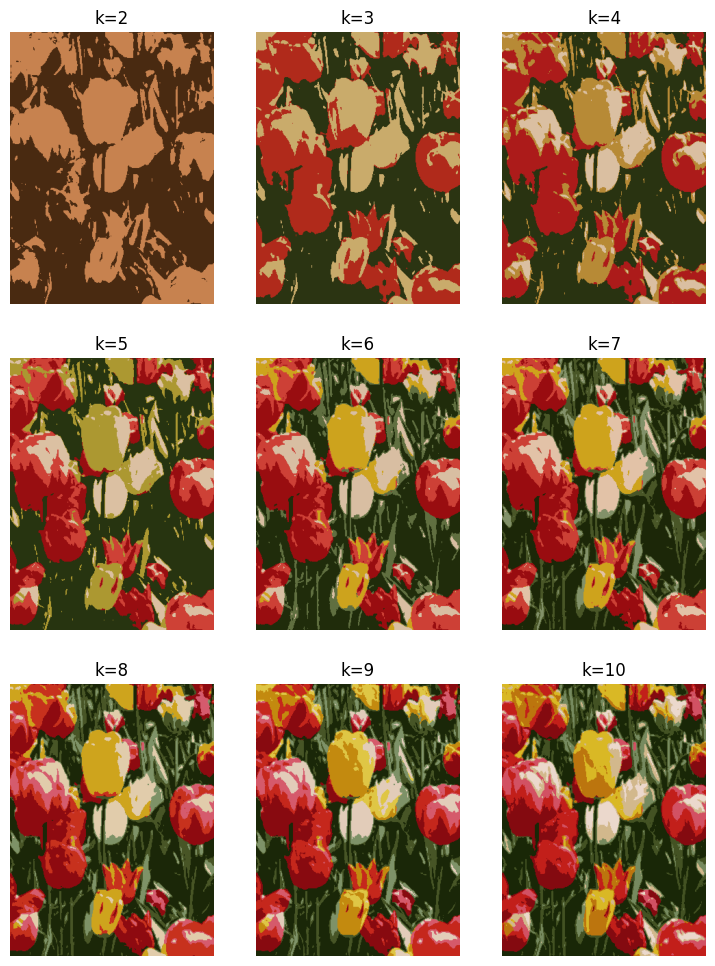

In [71]:
 # Helper function to plot image grid
def cluster_image_grid(k, ax, img=img):
  '''
  Fits a K-means model to a photograph.
  Replaces photo's pixels with RGB values of model's centroids.
  Displays the updated image on an axis of a figure.
    Args:
      k: (int)    - Your selected K-value
      ax: (int)   - Your selected K-value- Index of the axis of the figure to plot to
      img: (numpy array) - Your original image converted to a numpy array

  Returns:
    A new image where each row of img's array has been replaced with the \
    coordinates of its nearest centroid. Image is assigned to an axis that \
    can be used in an image grid figure.
  '''
  img_flat = img.reshape(img.shape[0]*img.shape[1], 3)
  kmeans = KMeans(n_clusters=k, random_state=42).fit(img_flat)
  new_img = img_flat.copy()

  for i in np.unique(kmeans.labels_):
    new_img[kmeans.labels_==i, :] = kmeans.cluster_centers_[i]

  new_img = new_img.reshape(img.shape)
  ax.imshow(new_img)
  ax.axis('off')

fig, axs = plt.subplots(3, 3)
fig = matplotlib.pyplot.gcf()
fig.set_size_inches(9, 12)
axs = axs.flatten()
k_values = np.arange(2, 11)
for i, k in enumerate(k_values):
  cluster_image_grid(k, axs[i], img=img)
  axs[i].title.set_text('k=' + str(k))

Notice that it becomes increasingly difficult to see the difference between the images each time a color is added. This is a visual example of something that happens with all clustering models, even if the data is not an image that you can see. As you group the data into more and more clusters,additional clusters beyond a certain point contribute less and less to your understanding of your data.

Hopefully, this demonstration has deepened your understanding of how the K-means algorithm works. Soon, we’ll explore methods for numerically determining which k value is best for particular data. As always, feel free to explore the notebook more on your own to keep building your skillset!

**Apply inertia and silhouette score**

**1 K-means inertia & silhouette score**

Throughout the following exercises, you will learn about the process of using inertia and silhouette
 score in scikit-learn to help determine a k value for a K-means model on higher-dimensional data
 that cannot easily be visualized in 2-D or 3-D space. Before starting on this programming exercise,
 we strongly recommend watching the video lecture and completing the IVQ for the associated
 topics.
 All the information you need for solving this assignment is in this notebook, and all the code you
 will be implementing will take place within this notebook.
 Focus items include:
    • Import statements
    • Scaling the data using StandardScaler
    • Instantiating the model
    • Fitting the model
    • KMeans labels_ attribute
    • KMeans inertia_ attribute
    • Using scikit-learn’s silhouette_score function
    • Determining a value for k

As we move forward, you can find instructions on how to install required libraries as they arise in this notebook.

**1.1 Import statements**

Before we begin with the exercises and analyzing the data, we need to import all libraries and extensions required for this programming exercise. Throughout the course, we will be using numpy and pandas for operations, and seaborn for data visualization.

Of particular note here, are the Kmeans, silhouette_score, and StandardScaler statements. These are the elements directly related to the K-means modeling process.

In [72]:
# IMPORT STATEMENTS
# Standard operational package imports
import numpy as np
import pandas as pd

### Important imports for modeling and evaluation
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.preprocessing import StandardScaler

# (To create synthetic data)
from sklearn.datasets import make_blobs
# Visualization package import
import seaborn as sns

**1.2 Create the data**

 In practice, you’d have a dataset of real data, and you’d read in this data and perform EDA, data
 cleaning, and other manipulations to prepare it for modeling. For simplicity and to help us focus
 on the modeling itself, we’re going to use synthetic data for this demonstration.

We’ll start by creating a random number generator. This is to help with the process of creating
 reproducible synthetic data. We’ll use it to create clustered data without us knowing how many
 clusters there are.

In [73]:
# Create random number generator
rng = np.random.default_rng(seed=44)

By calling the random number generator and assigning the result to a variable, we can avoid seeing the true number of clusters our data has. This keeps the “answer” a secret, and will let us use
 inertia and silhouette coefficients to determine it.

In [74]:
# Create synthetic data w/ unknown number of clusters
centers = rng.integers(low=3, high=7)
X, y = make_blobs(n_samples=1000, n_features=6, centers=centers, random_state=42)

The above steps that generated our synthetic data return two things: X and y. X is an array of the
 values for the synthetic data itself and y is an array that contains the cluster assignment for each
 sample in X (represented as an integer).

 Right now we’re concerned with X, because it is our mystery data. It’s currently an array, but
 it’s usually helpful to view your data as a pandas dataframe. This is often how your data will be
 organized when modeling real-world data, so we’ll convert our data to a pandas df.

In [75]:
# Create Pandas dataframe from the data
X = pd.DataFrame(X)
X.head()

,0,1,2,3,4,5
0,-1.534288,5.467808,-6.945988,1.403934,1.553836,-7.618236
1,-6.681020,6.717808,2.764396,4.460744,-8.286569,10.959708
2,-8.678310,7.825306,3.139699,5.609951,-9.948079,8.072149
3,-6.667385,7.147637,2.145505,4.712937,-9.544708,11.093248
4,-2.753835,-4.209968,0.620345,-7.439505,-4.405723,-2.046149


 We see that the data has 6 features (columns). This is too many for us to visualize in 2-D or
 3-D space. We can’t see how many clusters there are, so we’ll need to use our detective skills to
 determine this. ## Scale the data

 Since K-means uses distance between observations and centroids as its measure of similarity, it’s
 important to scale your data before modeling, if it’s not already scaled. It’s important to scale
 because K-means doesn’t know what your unit label is for each variable. Suppose you had data for
 penguins, and height were measured in meters and weight were measured in grams. Without scaling,
 significant differences in height would be represented as small numbers, while minor differences in
 weight would be represented as much larger numbers.

 To perform scaling, we’ll use scikit-learn’s StandardScaler. StandardScaler scales each point x￿ by
 subtracting the mean value for that feature and dividing by the standard deviation:

 x-scaled = (x￿– mean(x)) / ￿

 This ensures that, after scaling, each feature variable has a mean of 0 and variance/standard
 deviation of 1. There are a number of scaling techniques available, including StandardScaler,
 MinMaxScaler, Normalizer, and others, each scaling the data in a particular way. There’s no hard
 rule for determining which method will work best, but with K-means models, using any scaler will
 almost always result in better results than not scaling at all.

 You can instantiate StandardScaler and transform your data in a single step by using the
 .fit_transform() method and passing to it your data as an argument. Tip: If your computing
 environment has sufficient resources, it’s helpful to keep an unscaled copy of your data to use later.
 Assign the scaled data to a new variable.

In [76]:
# Scale the data
X_scaled = StandardScaler().fit_transform(X)
X_scaled[:2,:]

array([[-0.03173691,  0.4864719 , -1.32178135,  0.59808997,  1.5703227 ,
        -0.88951855],
       [-1.05006137,  0.68381835,  0.74465777,  1.2564266 , -0.97057774,
         1.92995522]])

**1.3 Instantiate the model**

Now that the data is scaled, we can start modeling. Since we don’t know how many clusters exist in the data, we’ll begin by examining the inertia values for different values of k.

One thing to note is that, by default, scikit-learn implements an optimized version of the K-means
 algorithm, called K-means++. This helps to ensure optimal model convergence by initializing
 centroids far away from each other. Because we’re using K-means++, we will not rerun the model
 multiple times.

We’ll begin by instantiating the model. If we want to build a model that clusters the data into
 three clusters, we’d set the n_clusters parameter to 3. We’ll also set the random_state to an
 arbitrary number. This is only so others can reproduce your results. If you left this value blank, it’s
 possible others could replicate your code exactly and still get different results due to the random
 initial placement of centroids.

In [77]:
# Instantiate model
kmeans3 = KMeans(n_clusters=3, random_state=42)

**1.4 Fit the data**

 Now that we’ve instantiated the model, the next step is to fit it to the data. We do this by using
 the .fit() method and passing to it our scaled data.

In [78]:
# Fit model to data
kmeans3.fit(X_scaled)

KMeans(n_clusters=3, random_state=42)

This returns a model object that has “learned” your data. You can now call its different attributes
 to see inertia, location of centroids, and class labels, among others. See the K-means documentation
 for a full list of available attributes.

 We can get the cluster assignments by using the .labels_ attribute. Similarly, we can get the
 inertia by using the .inertia_ attribute.

 Let’s see what happens when we check the cluster assignments and inertia for this model.

In [79]:
print('Clusters: ', kmeans3.labels_)
print('Inertia: ', kmeans3.inertia_)

Clusters:  [2 0 0 0 1 1 1 0 0 2 1 0 0 2 0 0 0 0 1 1 1 0 0 0 2 2 1 0 0 1 1 0 1 1 2 2 1
 0 0 0 1 0 1 0 0 1 1 2 0 2 1 1 1 2 2 2 1 0 1 2 1 1 1 1 1 1 1 2 1 1 0 1 1 1
 0 1 0 2 2 0 2 0 1 2 1 0 2 2 0 2 0 1 2 0 1 2 1 0 0 1 1 0 0 0 0 0 0 1 1 0 2
 1 0 1 0 0 1 1 2 1 1 1 0 1 1 0 0 1 2 0 2 2 2 1 0 2 2 1 0 1 1 1 0 2 2 2 1 1
 0 1 1 0 1 1 0 0 2 0 2 0 0 1 0 0 0 0 1 1 0 1 0 0 1 0 0 2 0 0 2 2 1 0 1 0 1
 0 2 0 2 0 1 1 1 0 0 0 2 2 0 1 0 0 1 0 1 1 1 1 1 2 1 2 0 0 1 2 2 0 1 1 2 1
 0 0 0 0 1 1 1 0 2 1 2 0 2 0 2 1 1 0 0 0 2 2 1 1 2 2 2 0 0 0 1 1 1 0 0 0 1
 0 1 2 1 0 0 2 2 1 1 0 1 2 0 1 0 0 0 0 1 0 0 1 0 0 1 1 1 1 1 0 2 1 0 1 2 2
 1 0 0 1 0 0 0 0 0 0 2 0 2 1 0 0 2 1 1 0 1 0 0 2 0 1 0 0 0 1 1 1 2 2 2 1 2
 2 2 0 0 2 0 2 1 0 1 2 0 2 1 0 1 0 0 0 0 1 1 0 1 0 1 1 1 2 0 0 0 0 0 1 1 2
 1 0 0 1 0 1 1 0 1 0 2 0 0 1 0 1 1 2 0 1 1 1 2 1 1 0 1 0 1 0 2 0 1 0 0 1 1
 2 0 1 1 2 1 1 0 0 0 0 1 0 1 0 0 2 2 1 2 1 1 1 0 0 2 1 0 0 0 1 0 1 0 2 0 1
 2 1 1 1 0 1 2 0 1 2 0 0 1 1 1 1 1 0 0 1 0 0 1 0 0 1 1 2 1 2 0 1 1 1 1 2 0
 0 1 0 0 2 2 0

The .labels_ attribute returns a list of values that is the same length as the training data. Each value corresponds to the number of the cluster to which that point is assigned. Since our K-means model clustered the data into three clusters, the value assigned to each observation will be 0, 1, or

 2. (Note that the cluster number itself is arbitrary, and serves only as a label.)

The .inertia_ attribute returns the sum of the squared distances of samples from their closest
 cluster center.

**1.5 Evaluate inertia**

This inertia value isn’t helpful by itself. We need to compare the inertias of multiple k values. To do this, we’ll create a function that fits a K-means model for multiple values of k, calculates the inertia for each k value, and appends it to a list.

In [80]:
# Create a list from 2-10.
num_clusters = [i for i in range(2, 11)]

def kmeans_inertia(num_clusters, x_vals):
  '''
  Fits a KMeans model for different values of k.
  Calculates an inertia score for each k value.

  Args:
    num_clusters: (list of ints) - The different k values to try
    x_vals:                      - The training data
    (array)

  Returns:
    inertia: (list)- A list of inertia scores, one for each \ value of k
  '''
  inertia = []
  for num in num_clusters:
    kms = KMeans(n_clusters=num, random_state=42)
    kms.fit(x_vals)
    inertia.append(kms.inertia_)

  return inertia

In [81]:
# Calculate inertia for k=2-10
inertia = kmeans_inertia(num_clusters, X_scaled)
inertia

[3686.250158732799,
 1748.148870307954,
 1124.6368935738392,
 239.65434758718456,
 232.7287150801515,
 224.29675072289993,
 216.22784318026888,
 210.98989981553547,
 202.30181069359637]

**1.5.1 Elbow plot**

Now we can plot these values in a simple line graph, with the k values along the x-axis and inertia on the y-axis. This type of plot is called an elbow plot. The “elbow” is usually the part of the curve with the sharpest angle, where the reduction in inertia that occurs when a new cluster is
 added begins to level off.

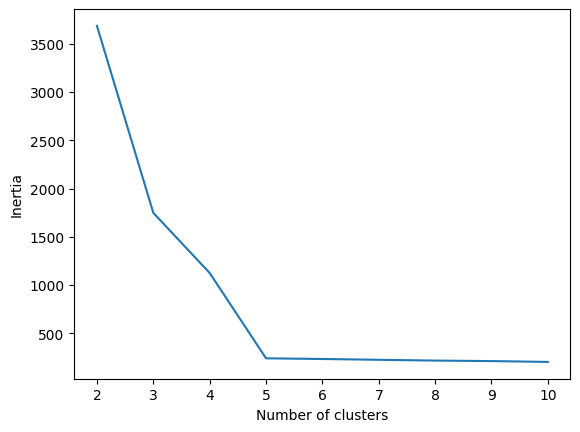

In [82]:
# Create an elbow plot
plot = sns.lineplot(x=num_clusters, y=inertia)
plot.set_xlabel("Number of clusters");
plot.set_ylabel("Inertia");

This plot contains an unambiguous elbow at five clusters. Models with more than five clusters don’t
 seem to reduce inertia much at all. Right now, it seems like a 5-cluster model might be optimal.

 Let’s now check silhouette scores. Hopefully the results will corroborate our findings from the
 assessment of inertia.

**1.6 Evaluate silhouette score**

 Unlike inertia, silhouette score doesn’t have its own attribute that can be called on the model object.
 To get a silhouette score, we have to use the silhouette_score() function that we imported from
 sklearn.metrics. You must pass to it two required parameters: your training data and their
 assigned cluster labels. Let’s see what this looks like for the kmeans3 model we created earlier.

In [83]:
# Get silhouette score for kmeans3 model
kmeans3_sil_score = silhouette_score(X_scaled, kmeans3.labels_)
kmeans3_sil_score

np.float64(0.5815196371994132)

It worked! However, this value isn’t very useful if we have nothing to compare it to. Just as we did for inertia, we’ll write a function that compares the silhouette score of each value of k, from 2 through 10.

In [84]:
def kmeans_sil(num_clusters, x_vals):
  '''
  Fits a KMeans model for different values of k.
  Calculates a silhouette score for each k value

    Args:
      num_clusters: (list of ints) - The different k values to try
      x_vals: (array)              - The training data

  Returns:
    sil_score: (list) - A list of silhouette scores, one for ach \ value of k
  '''
  sil_score = []
  for num in num_clusters:
    kms = KMeans(n_clusters=num, random_state=42)
    kms.fit(x_vals)
    sil_score.append(silhouette_score(x_vals, kms.labels_))

  return sil_score

In [85]:
# Calculate silhouette scores for k=2-10
sil_score = kmeans_sil(num_clusters, X_scaled)
sil_score

[np.float64(0.42005966017510427),
 np.float64(0.5815196371994132),
 np.float64(0.649060841277744),
 np.float64(0.7670656870960783),
 np.float64(0.6376325996351013),
 np.float64(0.5100290191946069),
 np.float64(0.4024771015104519),
 np.float64(0.3998551090636554),
 np.float64(0.2748795855657769)]

We can plot the silhouette score for each value of k, just as we did for inertia. However, remember that for silhouette score, greater numbers (closest to 1) are better, so we hope to see at least one clear “peak” that is close to 1.

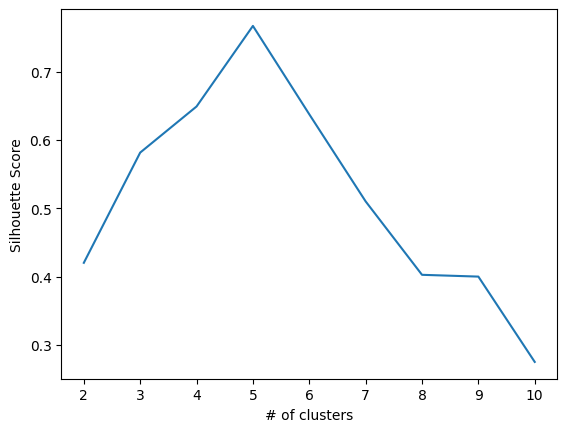

In [86]:
# Create a line plot of silhouette scores
plot = sns.lineplot(x=num_clusters, y=sil_score)
plot.set_xlabel("# of clusters");
plot.set_ylabel("Silhouette Score");

This plot indicates that the silhouette score is closest to 1 when our data is partitioned into five
 clusters. It confirms what we saw in the inertia analysis, where we noticed an elbow where k=5.

**1.7 Conclusion**

 At this point, between our inertia and silhouette score analyses, we can say with a reasonable degree
 of confidence that it makes the most sense to group our data into five clusters.

 Since we used synthetic data for this activity, we can cheat and check to see how many clusters
 actually existed in our data. We can do this by calling the centers variable, which we created
 with the random number generator at the beginning of this notebook.

In [87]:
# Verify our findings (only possible when "correct" number of clusters exists)
centers

np.int64(5)

We were right! Just as we predicted, there are indeed five distinct clusters in our data. We were able to deduce this by using inertia and silhouette score!

**1.8 Further analysis**

 Although we know that five clusters is the best grouping for the data, the work is far from done.
 At this point, we’ll instantiate a new K-means model with n_clusters=5 and fit it to our data.
 (Note that if we had saved all the models that we fit above for different values of k, we wouldn’t


need to refit a model now, we could just call that model from earlier. But since it wasn’t saved, we
 must fit another model.)

In [88]:
# Fit a 5-cluster model to the data
kmeans5 = KMeans(n_clusters=5, random_state=42)
kmeans5.fit(X_scaled)

KMeans(n_clusters=5, random_state=42)

In [89]:
print(kmeans5.labels_[:5])
print('Unique labels:', np.unique(kmeans5.labels_))

[2 4 4 4 1]
Unique labels: [0 1 2 3 4]


Now that we have our labels, it’s important to understand what they mean and decide whetherbthis clustering makes sense for our use case. Here’s where it helps to keep our unscaled data from the beginning. We can assign a new column to the original unscaled dataframe with the cluster
 assignment from the final K-means model.

In [90]:
# Create new column that indicates cluster assignment in original dataframe
X['cluster'] = kmeans5.labels_
X.head()

,0,1,2,3,4,5,cluster
0,-1.534288,5.467808,-6.945988,1.403934,1.553836,-7.618236,2
1,-6.681020,6.717808,2.764396,4.460744,-8.286569,10.959708,4
2,-8.678310,7.825306,3.139699,5.609951,-9.948079,8.072149,4
3,-6.667385,7.147637,2.145505,4.712937,-9.544708,11.093248,4
4,-2.753835,-4.209968,0.620345,-7.439505,-4.405723,-2.046149,1


Now, we can perform analyses on the different clusters to see what makes them different from one
 another. The reason we’d look at cluster assignments with the unscaled data is because it’s easier
 to relate to the unit measures. This is often a useful technique for analyzing your data, but it may
 also make sense to look at your cluster assignments on the scaled data, depending on your use case.

 Note that in many cases, it’s not always clear what differentiates one cluster from another, and it
 takes a lot of work to determine whether or not it makes sense to cluster your data a given way.
 This is where expertise and domain knowledge are very valuable.
 Congratulations! You now know about two very important tools to help you evaluate your K-means
 models, and you know how to implement them in scikit-learn. Soon, you’ll apply these skills to
 real-world data. As always, feel free to refer back to this notebook as you continue learning.

**2 Bonus content**

**2.1 Predicting on new data**

 This is not applicable to all clustering tasks, but it’s now possible to take in new data and predict a cluster assignment using our final model. To demonstrate this, we’ll need a new observation, one that was not contained in our original
 data. We can create this with the random number generator that we used at the beginning of the
 notebook.

In [91]:
# Create a new observation (for demonstration)
new_observation = rng.uniform(low=-10, high=10, size=6).reshape(1,-1)
new_observation

array([[-4.8377385 , -1.88458544,  9.38367896, -6.7536575 ,  7.14587347,
        -6.73909458]])

Just as before, we must scale this new data the same way we did earlier. This means that we need
 to subtract the mean of the training data and divide by the standard deviation of the training data.
 If you forgot to scale here you’d get invalid results, because your model would be trained on scaled
 data while the new data going into it would be unscaled.

 Here, we must reinstantiate a scaler and fit it to the original data, because we didn’t save the scaler
 object itself when we performed scaling above. We fit and transformed the data in a single line of
 code, without saving the fit scaler object.

 Above, if instead of:
 X_scaled = StandardScaler().fit_transform(X)

 we had written:

 scaler = StandardScaler()fit.(X)
 X_scaled = scaler.transform(X)
 then we could have reused scaler in this next step without having to assign it.

In [92]:
# Instantiate the scaler and fit it to the original X data
scaler = StandardScaler().fit(X.iloc[:,:-1])

# Apply the scaler to the new observation
new_observation_scaled = scaler.transform(new_observation)
new_observation_scaled

array([[-0.68535259, -0.67430308,  2.1532887 , -1.15878741,  3.01424824,
        -0.75609599]])

We can use the .predict() method of our kmeans5 model to predict a cluster assignment by passing to it the new observation. In this case, we only have a single observation, but it’s also
 possible to pass an array of new data as an argument, and it would return an array of cluster
 predictions.

In [93]:
# Predict cluster assignment of new_observation
new_prediction = kmeans5.predict(new_observation_scaled)
new_prediction

array([1], dtype=int32)

The model has assigned this new observation to cluster 4.

**2.2 Calculating the distance to each centroid**

The KMeans model also lets us access the distances of observations from each centroid. For new data, we can do this using the .transform_ method of the fit model object.

In [94]:
# Calculate distances between new data and each centroid
distances = kmeans5.transform(new_observation_scaled)
distances

array([[4.55233304, 3.46792667, 4.14567617, 5.11675395, 5.95732403]])

Notice that the .transform_ method returns an array. In this case, we gave the model a single new data point, and it returned an array of five numbers (because our model has five clusters). Each value in the array represents the distance between new_observation_scaled and the centroid of the cluster at that index.

So, the distance between new_observation_scaled and the centroids of:

    Cluster 0 = 5.12
    Cluster 1 = 4.55
    Cluster 2 = 4.15
    Cluster 3 = 5.96
    Cluster 4 = 3.47

The shortest distance is 3.47—between new_observation_scaled and cluster 4’s centroid. This is why the point was assigned to cluster 4 when we used the .predict() method above.

 2.3 Why is this useful?
 One situation for which being able to assign new points to clusters is useful is when you have a
 deployed model that was trained on huge amounts of data, and it must process new data as it
 comes in on a case-by-case basis. For example, suppose you have a marketing program that sends
 out different promotional emails to different customers, depending on their engagement patterns
 with your brand. When you get a new customer, you could use a clustering model to assign them
 to an appropriate marketing campaign, so they see promotions that are most appropriate for them.

 Also, both the cluster predictions and the distance measurements to centroids can be used as new
 features in supervised learning models. You can take the training data of a supervised learning
 problem and cluster it, then use either the cluster assignments or the distance matrices as engineered
 predictive features to improve the predictive power of a supervised learning model.

# K-means model

**1.1 Introduction**

K-means clustering is very effective when segmenting data and attempting to find patterns. Because clustering is used in a broad array of industries, becoming proficient in this process will help you expand your skillset in a widely applicable way.

 In this activity, you are a consultant for a scientific organization that works to support and sustain
 penguin colonies. You are tasked with helping other staff members learn more about penguins in
 order to achieve this mission.

 The data for this activity is in a spreadsheet that includes datapoints across a sample size of 345
 penguins, such as species, island, and sex. Your will use a K-means clustering model to group this
 data and identify patterns that provide important insights about penguins.

 Note: Because this lab uses a real dataset, this notebook will first require basic EDA, data cleaning,
 and other manipulations to prepare the data for modeling.

**1.2 Step 1: Imports**

Import statements including K-means, silhouette_score, and StandardScaler. ### Import packages.

In [95]:
# Import standard operational packages.
import numpy as np
import pandas as pd

# Important tools for modeling and evaluation.
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.preprocessing import StandardScaler

# Import visualization packages.
import matplotlib.pyplot as plt
import seaborn as sns

Pandas is used to load the penguins dataset, which is built into the seaborn library. The resulting pandas DataFrame is saved in a variable named penguins. As shown in this cell, the dataset has been automatically loaded in for you. You do not need to download the .csv file, or provide more code, in order to access the dataset and proceed with this lab. Please continue with this activity by completing the following instructions.

In [96]:
# RUN THIS CELL TO IMPORT YOUR DATA.
# Save the `pandas` DataFrame in variable `penguins`.
penguins = pd.read_csv("penguins.csv")

Now, review the first 10 rows of data.

In [97]:
# Review the first 10 rows.
penguins.head(n = 10)

,Unnamed: 0,species,island,bill_length_mm,bill_depth_mm,flipper_length_mm,body_mass_g,sex,year
0,1,Adelie,Torgersen,39.1,18.7,181.0,3750.0,male,2007
1,2,Adelie,Torgersen,39.5,17.4,186.0,3800.0,female,2007
2,3,Adelie,Torgersen,40.3,18.0,195.0,3250.0,female,2007
3,4,Adelie,Torgersen,NaN,NaN,NaN,NaN,NaN,2007
4,5,Adelie,Torgersen,36.7,19.3,193.0,3450.0,female,2007
5,6,Adelie,Torgersen,39.3,20.6,190.0,3650.0,male,2007
6,7,Adelie,Torgersen,38.9,17.8,181.0,3625.0,female,2007
7,8,Adelie,Torgersen,39.2,19.6,195.0,4675.0,male,2007
8,9,Adelie,Torgersen,34.1,18.1,193.0,3475.0,NaN,2007
9,10,Adelie,Torgersen,42.0,20.2,190.0,4250.0,NaN,2007


**1.3 Step 2: Data exploration**

After loading the dataset, the next step is to prepare the data to be suitable for clustering. This includes:

    • Exploring data
    • Checking for missing values
    • Encoding data
    • Dropping a column
    • Scaling the features using StandardScaler

**1.3.1 Explore data**

To cluster penguins of multiple different species, determine how many different types of penguin
 species are in the dataset.

In [98]:
# Find out how many penguin types there are.
penguins['species'].unique()

array(['Adelie', 'Gentoo', 'Chinstrap'], dtype=object)

Use the unique() method on the column 'species'.

In [99]:
# Find the count of each species type.
penguins['species'].value_counts(dropna = False)

,count
species,
Adelie,152
Gentoo,124
Chinstrap,68


**Question:** How many types of species are present in the dataset?
 There are three types of species. Note the Chinstrap species is less common than the other species.
 This has a chance to affect K-means clustering as K-means performs best with similar sized group
ings.

**Question:** Why is it helpful to determine the perfect number of clusters using K-means when you
 already know how many penguin species the dataset contains?
 For purposes of clustering, pretend you don’t know that there are three different types of species.
 Then, you can explore whether the algorithm can discover the different species. You might even f ind other relationships in the data.

**1.3.2 Check for missing values**

An assumption of K-means is that there are no missing values. Check for missing values in the rows of the data.

In [100]:
# Check for missing values.
penguins.isnull().sum()

,0
Unnamed: 0,0
species,0
island,0
bill_length_mm,2
bill_depth_mm,2
flipper_length_mm,2
body_mass_g,2
sex,11
year,0


Now, drop the rows with missing values and save the resulting pandas DataFrame in a variable named penguins_subset.

In [101]:
# Drop rows with missing values.
# Save DataFrame in variable `penguins_subset`.
penguins_subset = penguins.dropna(axis=0).reset_index(drop = True)

Next, check to make sure that penguins_subset does not contain any missing values.

In [102]:
# Check for missing values.
penguins_subset.isna().sum()

,0
Unnamed: 0,0
species,0
island,0
bill_length_mm,0
bill_depth_mm,0
flipper_length_mm,0
body_mass_g,0
sex,0
year,0


Now, review the first 10 rows of the subset.

In [103]:
# View first 10 rows.
penguins_subset.head(10)

,Unnamed: 0,species,island,bill_length_mm,bill_depth_mm,flipper_length_mm,body_mass_g,sex,year
0,1,Adelie,Torgersen,39.1,18.7,181.0,3750.0,male,2007
1,2,Adelie,Torgersen,39.5,17.4,186.0,3800.0,female,2007
2,3,Adelie,Torgersen,40.3,18.0,195.0,3250.0,female,2007
3,5,Adelie,Torgersen,36.7,19.3,193.0,3450.0,female,2007
4,6,Adelie,Torgersen,39.3,20.6,190.0,3650.0,male,2007
5,7,Adelie,Torgersen,38.9,17.8,181.0,3625.0,female,2007
6,8,Adelie,Torgersen,39.2,19.6,195.0,4675.0,male,2007
7,13,Adelie,Torgersen,41.1,17.6,182.0,3200.0,female,2007
8,14,Adelie,Torgersen,38.6,21.2,191.0,3800.0,male,2007
9,15,Adelie,Torgersen,34.6,21.1,198.0,4400.0,male,2007


 **1.3.3 Encode data**

Some versions of the penguins dataset have values encoded in the sex column as ‘Male’ and ‘Female’
 instead of ‘MALE’ and ‘FEMALE’. The code below will make sure all values are ALL CAPS.

In [104]:
penguins_subset['sex'] = penguins_subset['sex'].str.upper()

K-means needs numeric columns for clustering. Convert the categorical column 'sex' into numeric.
 There is no need to convert the 'species' column because it isn’t being used as a feature in the
 clustering algorithm.

In [105]:
# Convert `sex` column from categorical to numeric.
penguins_subset = pd.get_dummies(penguins_subset, drop_first = True, columns=['sex'])

**1.3.4 Drop a column**

 Drop the categorical column island from the dataset. While it has value, this notebook is trying
 to confirm if penguins of the same species exhibit different physical characteristics based on sex.
 This doesn’t include location.

 Note that the 'species' column is not numeric. Don’t drop the 'species' column for now. It
 could potentially be used to help understand the clusters later.

In [106]:
# Drop the island column.
penguins_subset = penguins_subset.drop(['island'], axis=1)

1.3.5 Scale the features
 Because K-means uses distance between observations as its measure of similarity, it’s important
 to scale the data before modeling. Use a third-party tool, such as scikit-learn’s StandardScaler
 function. StandardScaler scales each point x￿ by subtracting the mean observed value for that
 feature and dividing by the standard deviation:
 x-scaled = (x￿– mean(X)) / ￿
 This ensures that all variables have a mean of 0 and variance/standard deviation of 1.
 Note: Because the species column isn’t a feature, it doesn’t need to be scaled.
 First, copy all the features except the 'species' column to a DataFrame X.

In [107]:
# Exclude `species` variable from X
X = penguins_subset.drop(['species'], axis=1)

Scale the features in X using StandardScaler, and assign the scaled data to a new variable
 X_scaled.

In [108]:
#Scale the features.
#Assign the scaled data to variable `X_scaled`.

X_scaled = StandardScaler().fit_transform(X)

**1.4 Step 3: Data modeling**

 Now, fitK-meansandevaluate inertia for different values of k. Because you may not know how many
 clusters exist in the data, start by fitting K-means and examining the inertia values for different
 values of k. To do this, write a function called kmeans_inertia that takes in num_clusters and
 x_vals (X_scaled) and returns a list of each k-value’s inertia.
 When using K-means inside the function, set the random_state to 42. This way, others can
 reproduce your results.

In [109]:
# Fit K-means and evaluate inertia for different values of k.
num_clusters = [i for i in range(2, 11)]
def kmeans_inertia(num_clusters, x_vals):
  """
  Accepts as arguments list of ints and data array.
  Fits a KMeans model where k = each value in the list of ints.
  Returns each k-value's inertia appended to a list.
  """
  inertia = []
  for num in num_clusters:
    kms = KMeans(n_clusters=num, random_state=42)
    kms.fit(x_vals)
    inertia.append(kms.inertia_)

  return inertia

Use the kmeans_inertia function to return a list of inertia for k=2 to 10.

In [110]:
# Return a list of inertia for k=2 to 10.
inertia = kmeans_inertia(num_clusters, X_scaled)
inertia

[1506.2357764520402,
 1215.2534261120525,
 1027.3764376000104,
 699.9016714231603,
 634.2887320083596,
 595.5302253110846,
 465.64525884475097,
 414.5446822944832,
 382.0911055530549]

 Next, create a line plot that shows the relationship between num_clusters and inertia. Use either
 seaborn or matplotlib to visualize this relationship.

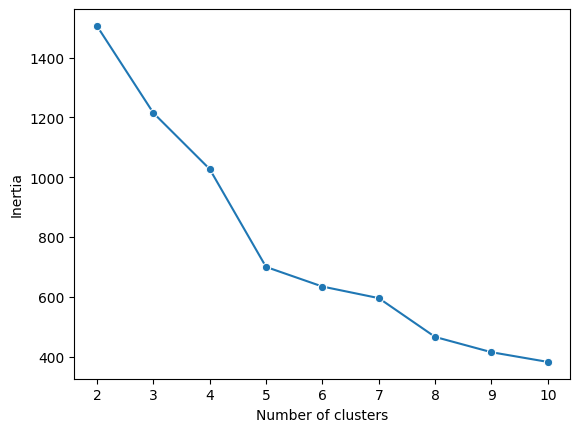

In [111]:
# Create a line plot.
plot = sns.lineplot(x=num_clusters, y=inertia, marker = 'o')
plot.set_xlabel("Number of clusters");
plot.set_ylabel("Inertia");

**Question:** Where is the elbow in the plot?

 The plot seems to depict an elbow at six clusters, but there isn’t a clear method for confirming
 that a six-cluster model is optimal. Therefore, the silhouette scores should be checked.

**1.5 Step 4: Results and evaluation**

 Now, evaluate the silhouette score using the silhouette_score() function. Silhouette scores are
 used to study the distance between clusters.
 Then, compare the silhouette score of each value of k, from 2 through 10. To do this, write a
 function called kmeans_sil that takes in num_clusters and x_vals (X_scaled) and returns a list
 of each k-value’s silhouette score.

In [112]:
# Evaluate silhouette score.
# Write a function to return a list of each k-value's score.

def kmeans_sil(num_clusters, x_vals):
  """
  Accepts as arguments list of ints and data array.
  Fits a KMeans model where k = each value in the list of ints.
  Calculates a silhouette score for each k value.
  Returns each k-value's silhouette score appended to a list.
  """
  sil_score = []
  for num in num_clusters:
    kms = KMeans(n_clusters=num, random_state=42)
    kms.fit(x_vals)
    sil_score.append(silhouette_score(x_vals, kms.labels_))

  return sil_score

sil_score = kmeans_sil(num_clusters, X_scaled)
sil_score

[np.float64(0.32780662383806225),
 np.float64(0.3147646088944368),
 np.float64(0.30471487778117007),
 np.float64(0.3920716763122453),
 np.float64(0.37216569182799547),
 np.float64(0.34786692844204314),
 np.float64(0.40814936452640255),
 np.float64(0.3946007323518093),
 np.float64(0.39321446069249966)]

Next, create a line plot that shows the relationship between num_clusters and sil_score. Use
 either seaborn or matplotlib to visualize this relationship.

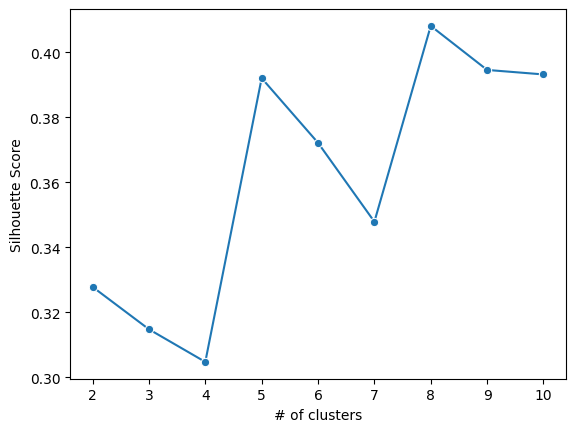

In [113]:
# Create a line plot.
plot = sns.lineplot(x=num_clusters, y=sil_score, marker = 'o')
plot.set_xlabel("# of clusters");
plot.set_ylabel("Silhouette Score");

**Question:** What does the graph show?
 Silhouette scores near 1 indicate that samples are far away from neighboring clusters. Scores close
 to 0 indicate that samples are on or very close to the decision boundary between two neighboring
 clusters.

The plot indicates that the silhouette score is closest to 1 when the data is partitioned into six
 clusters, although five clusters also yield a relatively good silhouette score.


**1.5.1 Optimal k-value**
 To decide on an optimal k-value, fit a six-cluster model to the dataset.

In [114]:
# Fit a 6-cluster model.
kmeans6 = KMeans(n_clusters=6, random_state=42)
kmeans6.fit(X_scaled)

KMeans(n_clusters=6, random_state=42)

In [115]:
# Print unique labels.
print('Unique labels:', np.unique(kmeans6.labels_))

Unique labels: [0 1 2 3 4 5]


Now, create a new column cluster that indicates cluster assignment in the DataFrame
 penguins_subset. It’s important to understand the meaning of each cluster’s labels, then de
cide whether the clustering makes sense.

 **Note:** This task is done using penguins_subset because it is often easier to interpret unscaled
 data.

In [116]:
# Create a new column `cluster`.
penguins_subset['cluster'] = kmeans6.labels_
penguins_subset.head()

,Unnamed: 0,species,bill_length_mm,bill_depth_mm,flipper_length_mm,body_mass_g,year,sex_MALE,cluster
0,1,Adelie,39.1,18.7,181.0,3750.0,2007,True,2
1,2,Adelie,39.5,17.4,186.0,3800.0,2007,False,5
2,3,Adelie,40.3,18.0,195.0,3250.0,2007,False,5
3,5,Adelie,36.7,19.3,193.0,3450.0,2007,False,5
4,6,Adelie,39.3,20.6,190.0,3650.0,2007,True,2


Use groupby to verify if any 'cluster' can be differentiated by 'species'.

In [117]:
# Verify if any `cluster` can be differentiated by `species`.
3450.0
3650.0
penguins_subset.groupby(by=['cluster', 'species']).size()

cluster  species  
0        Adelie       26
         Chinstrap     2
1        Gentoo       61
2        Adelie       73
3        Gentoo       58
4        Chinstrap    66
5        Adelie       47
dtype: int64

Next, interpret the groupby outputs. Although the results of the groupby show that each 'cluster'
 can be differentiated by 'species', it is useful to visualize these results. The graph shows that
 each 'cluster' can be differentiated by 'species'.
 Note: The code for the graph below is outside the scope of this lab.

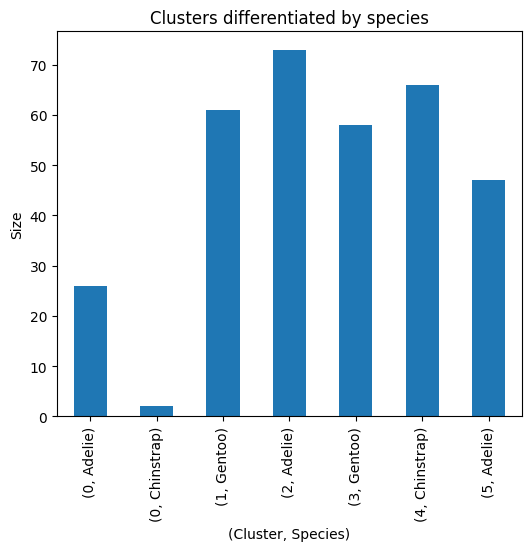

In [118]:
penguins_subset.groupby(by=['cluster', 'species']).size().plot.bar(title='Clusters differentiated by species', figsize=(6,5), ylabel='Size', xlabel='(Cluster, Species)');

 Use groupby to verify if each 'cluster' can be differentiated by 'species' AND 'sex_MALE'.

In [119]:
# Verify if each `cluster` can be differentiated by `species` AND `sex_MALE`.
penguins_subset.groupby(by=['cluster','species', 'sex_MALE']).size().sort_values(ascending = False)

cluster  species    sex_MALE
2        Adelie     True        73
1        Gentoo     True        61
3        Gentoo     False       58
5        Adelie     False       47
4        Chinstrap  True        34
                    False       32
0        Adelie     False       26
         Chinstrap  False        2
dtype: int64

**Question:** Are the clusters differentiated by 'species' and 'sex_MALE'? Even though clusters 1 and 3 weren’t all one species or sex, the groupby indicates that the algorithm
 produced clusters mostly differentiated by species and sex.
 Finally, interpret the groupby outputs and visualize these results. The graph shows that each
 'cluster' can be differentiated by 'species' and 'sex_MALE'. Furthermore, each cluster is mostly
 comprised of one sex and one species.

**Note:** The code for the graph below is outside the scope of this lab.

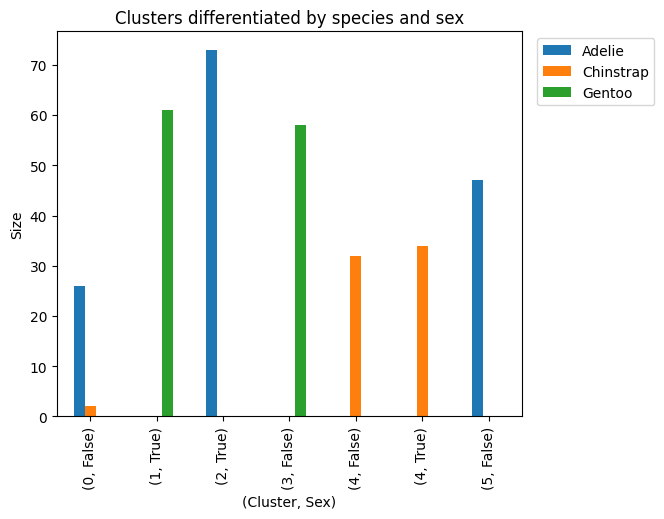

In [120]:
penguins_subset.groupby(by=['cluster','species','sex_MALE']).size().unstack(level = 'species', fill_value=0).plot.bar(title='Clusters differentiated by species and sex', figsize=(6, 5), ylabel='Size', xlabel='(Cluster, Sex)')
plt.legend(bbox_to_anchor=(1.3, 1.0))


**1.6 Considerations**

 What are some key takeaways that you learned during this lab? Consider the process
 you used, key tools, and the results of your investigation.- Many machine learning
 workflows are about cleaning, encoding, and scaling data.- Inertia and silhouette score can be
 used to find the optimal value of clusters.- Clusters can find natural groupings in data.- The
 clusters in this lab are mostly differentiated by species and sex as shown by the groupby results
 and corresponding graphs.- The elbow plot and especially the silhouette scores suggests that 6
 clusters are optimal for this data.- Having 6 clusters makes sense because the study suggests that
 there is sexual dimorphism (differences between the sexes) for each of the three species (2 sexes *
 3 different species = 6 clusters).

 What summary would you provide to stakeholders? * The K-means clustering enabled this
 data to be effectively grouped. It helped identify patterns that can educate team members about
 penguins. * The success of the cluster results suggests that the organization can apply clustering
 to other projects and continue augmenting employee education.

 **1.6.1 References**
 Gorman, Kristen B., et al. “Ecological Sexual Dimorphism and Environmental Variability within
 16 a Community of Antarctic Penguins (Genus Pygoscelis).” PLOS ONE, vol. 9, no. 3, Mar. 2014, p. e90081. PLoS Journals

 Sklearn Preprocessing StandardScaler scikit-learn

# Decision tree model

**1 Decision tree**

 Throughout the following exercises, you will learn to construct and interpret a decision tree model with scikit-learn. Before starting on this programming exercise, we strongly recommend watching the video lecture for the associated topics.

 This notebook contains the code used in two instructional videos from Week 4: Tree-based modeling. Start from the beginning to follow along with the video, Build a decision tree with Python.

 All the information you need for solving this assignment is in this notebook, and all the code you will be implementing will take place within this notebook.

 Topics of focus include:

 • Relevant import statements

 • Selecting an evaluation metric

 • Encoding of categorical features as dummies

 • Stratification during data splitting

 • Fitting a model

 • Model evaluation using precision, recall, and F1 score

 • Plotting the decision tree and examining its splits

 As we move forward, you can find instructions on how to install required libraries as they arise in
 this notebook.

 **1.1 Modeling objective**

 The modeling objective is to build and test a decision tree model that uses banking data to predict whether a customer will churn. If a customer churns, it means they left the bank and took their business elsewhere. If we can predict customers who are likely to churn, we can take measures to retain them before they do. These measures could be promotions, discounts, or other incentives to boost customer satisfaction and, therefore, retention.

** 1.1.1 Model design and target variable**

 Our data dictionary shows that there is a column called Exited. This is a Boolean value that indicates whether or not a customer left the bank (0 = did not leave, 1 = did leave). This will be our target variable. In other words, for each customer, our model should predict whether they should have a 0 or a 1 in the Exited column.

This is a classification task because we are trying to predict on a binary class. Therefore, we will use a DecisionTreeClassifier model.

 **1.1.2 A note on modeling workflow and model selection**
 This notebook is used together with other notebooks in this course that model the same data.
 Because of this, we will build all of our models across all of these notebooks, and model selection will take place in the final notebook. The champion model will be the one that performs best on the validation data. Only this final model will be evaluated using the test data.

 This approach has a limitation. We are using the same data to tune the hyperparameters as we are using to perform model selection. This risks potentially overfitting the model to the validation data.

 Ideally, with enough time and data, we’d tune the models’ hyperparameters, then score all the models on separate validation data and perform model selection based on these scores. Finally, the champion model would be scored on the test holdout data to get an estimate of how the model can be expected to perform on new, unseen data.

 Build a decision tree with Python

** 1.2 Import statements**

 Before we begin with the exercises and analyzing the data, we need to import all libraries and extensions required for this programming exercise. Throughout the course, we will be using numpy and pandas for operations, and matplotlib for plotting.


In [121]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier

# This function displays the splits of the tree
from sklearn.tree import plot_tree
from sklearn.metrics import ConfusionMatrixDisplay, confusion_matrix
from sklearn.metrics import recall_score, precision_score, f1_score,accuracy_score

**1.3 Read in the data**

In [122]:
# Read in data
file = 'Churn_Modelling.csv'
df_original = pd.read_csv(file)
df_original.head()

,RowNumber,CustomerId,Surname,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited
0,1,15634602,Hargrave,619,France,Female,42,2,0.00,1,1,1,101348.88,1
1,2,15647311,Hill,608,Spain,Female,41,1,83807.86,1,0,1,112542.58,0
2,3,15619304,Onio,502,France,Female,42,8,159660.80,3,1,0,113931.57,1
3,4,15701354,Boni,699,France,Female,39,1,0.00,2,0,0,93826.63,0
4,5,15737888,Mitchell,850,Spain,Female,43,2,125510.82,1,1,1,79084.10,0


**1.4 Examine the data**

 At this point in a typical data science project, you’d do a thorough exploratory data analysis (EDA)
 to better understand your data and what it’s telling you. For the purposes of this lab, we will skip
 this.
 In the steps that follow, we’ll perform many of the same steps that we took to build our Naive
 Bayes model. We’ll redo them here to review them for good measure.
 We’ll begin by checking the balance of the classes in our target variable (Exited), as this will help
 us determine how to prepare our data. It will also inform our decision of what evaluation metric
 to use to select our final model.

In [123]:
# Check class balance
df_original['Exited'].value_counts()

,count
Exited,
0,7963
1,2037


The class of our target variable is split roughly 80/20. In other words, ~20% of the people in this dataset churned. This is an unbalanced dataset, but it’s not extreme. We will preserve this ratio when we model.

**1.5 Select an evaluation metric**

 The data contains 10,000 observations, and the class distribution is approximately 80/20.
 Since we have some imbalance in our target classes, we know that if we measure model performance
 by accuracy alone, the model could predict 0 (no churn) 100% of the time and have an accuracy
 of ~80%. An accuracy of 80% might seem pretty good, but we know in this case it would be
 meaningless, because our model would fail to identify anybody who churned. Therefore, accuracy
 is not the best metric to use to evaluate our model’s performance.
 To determine which evaluation metric might be best, consider how our model might be wrong.
 There are two possibilities for bad predictions:

    • False positives: When the model predicts a customer will churn when in fact they won’t
    • False negatives: When the model predicts a customer will not churn when in fact they will

 As you know, there are a number of performance metrics aside from accuracy to choose from. Some
 of these include precision, recall, and F1 score. Let’s examine these more closely, beginning with
 precision:

 precision = TP / (FP + TP)

 And *recall*:

 recall = TP / FN + TP

  Refer to the confusion matrix for a reminder on what the terms represent.

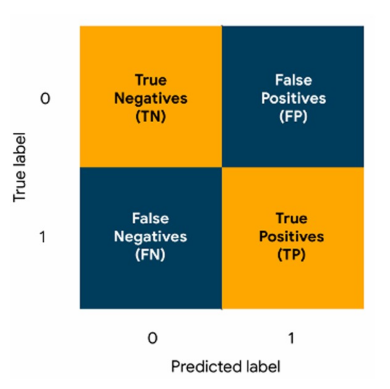

In [124]:
# upload imagen
cm = mpimg.imread('/content/confusion_matrix.jpg')

# Show imagen
plt.imshow(cm)
plt.axis('off') # Hide the axes
plt.show()



Precision represents the percentage of all our model’s predicted positives that are true positives.
 This might not be the best metric for us to use, because it disincentivizes predicting someone will
 churn unless there is a high degree of certainty that they will. This could translate to a high rate
 of false negatives.

 On the other hand, recall represents the percentage of all actual positives that the model identifies
 as such. This also might not be the best metric to use, because it rewards predicting someone will
 churn even if the likelihood of their doing so is very small. This could translate to a high rate of
 false positives.

 So which is worse, false positives or false negatives? Well, we’d first have to define what worse
 means. This is dependent on the details of the project that you’re working on. For the sake of this
 exercise, let us suppose that we’re defining it as the error that would cost the bank more money.

 We can quickly get an idea of how much money each customer who churns costs the bank by
 calculating the average balance of all customers who churned.

In [125]:
# Calculate average balance of customers who churned
avg_churned_bal = df_original[df_original['Exited']==1]['Balance'].mean()
avg_churned_bal

np.float64(91108.53933726068)

This shows that the customers who churned each took with them €91,108.54, on average. That’s
 a lot of money! This represents the average cost of the model predicting a false negative.

 What’s the cost of predicting a false positive? Well, it’s the cost of whatever the incentive might
 be to convince someone to stay with the bank when they were going to stay regardless of whether
 or not they were incentived. We don’t have a number for this, and even if it’s probably less than
 €91,108.54, it still could be thousands of Euros per customer in lost revenue, depending on the
 details of the incentive.

 Since correctly identifying customers who will churn is potentially very valuable, we could select
 recall as our most important metric. This might be a perfectly valid approach, depending on the
 specifics of the campaign. But this could also be problematic. After all, if we select a model based
 solely on recall, we could select a very biased model that predicts everyone to churn, but then 8,000
 people would be given incentives needlessly.

 Since we don’t know the exact cost of predicting a false negative, we’ll make an assumption for this
 exercise. We’ll assume that a metric that balances precision and recall is best. The metric that
 helps us achieve this balance is F1 score, which is defined as the harmonic mean of precision and
 recall.

 F1 = 2 (precision * recall) / (precision + recall)

 Again, there are many metrics to choose from. The important thing is that you make an informed
 decision that is based on your use case.

 Now that we’ve decided on an evaluation metric, let’s prepare the data for modeling.

 **1.6 Feature engineering**

 **1.6.1 Feature selection**

 In this step, we’ll prepare the data for modeling. These are the same steps as what we did for the
 Naive Bayes model. For more thorough explanation of this process, refer to the Feature Engineering
 notebook from Module 3. Note that for time considerations, we won’t create any new features.

 We begin by dropping the columns that we wouldn’t expect to offer any predictive signal to the
 model. These columns include RowNumber, CustomerID, and Surname. We’ll drop these columns
 so they don’t introduce noise to our model.

 We’ll also drop the Gender column, because we don’t want our model to make predictions based
 on gender.

In [126]:
# Create a new df that drops RowNumber, CustomerId, Surname, and Gender cols
churn_df = df_original.drop(['RowNumber', 'CustomerId', 'Surname','Gender'], axis=1)
churn_df.head()

,CreditScore,Geography,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited
0,619,France,42,2,0.00,1,1,1,101348.88,1
1,608,Spain,41,1,83807.86,1,0,1,112542.58,0
2,502,France,42,8,159660.80,3,1,0,113931.57,1
3,699,France,39,1,0.00,2,0,0,93826.63,0
4,850,Spain,43,2,125510.82,1,1,1,79084.10,0


 **1.6.2 Feature transformation**

 Next, we’ll dummy encode the Geography variable, which is categorical. There are three possible
 categories captured here: France, Spain, and Germany. When we call pd.get_dummies() on this
 feature, it will replace the Geography column with three new Boolean columns–one for each possible
 category contained in the column being dummied.

 When we specify drop_first='True' in the function call, it means that instead of replacing
 Geography with three new columns, it will instead replace it with two columns. We can do this
 because no information is lost from this, but the dataset is shorter and simpler.

 In this case, we end up with two new columns called Geography_Germany and Geography_Spain.
 We don’t need a Geography_France column. Why not? Because if a customer’s values in
 Geography_Germany and Geography_Spain are both 0, we’ll know they’re from France!

In [127]:
# Dummy encode categorical variables
churn_df = pd.get_dummies(churn_df, drop_first=True)
churn_df.head()

,CreditScore,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited,Geography_Germany,Geography_Spain
0,619,42,2,0.00,1,1,1,101348.88,1,False,False
1,608,41,1,83807.86,1,0,1,112542.58,0,False,True
2,502,42,8,159660.80,3,1,0,113931.57,1,False,False
3,699,39,1,0.00,2,0,0,93826.63,0,False,False
4,850,43,2,125510.82,1,1,1,79084.10,0,False,True


**1.7 Split the data**

 It’s time to split the data into features and target variable, and into training data and test data.
 We do this using the train_test_split() function. We’ll put 25% of the data into our test set,
 and use the remaining 75% to train the model.

 Don’t forget to include the stratify=y parameter, as this is what ensures that the 80/20 class
 ratio of the target variable is maintained in both the training and test datasets after splitting.

 Lastly, we set a random seed so we and others can reproduce our work.

In [128]:
# Define the y (target) variable
y = churn_df['Exited']

# Define the X (predictor) variables
X = churn_df.copy()
X = X.drop('Exited', axis=1)

# Split into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                    test_size=0.25, stratify=y,
                                                    random_state=42)

**1.8 Baseline model**

 We’ll first train a baseline model, just to get a sense of how predictive the data is and to give us
 scores that we can reference later.
 This will also show the process of instantiating and fitting the
 model, and then using it to make predictions. We’ll predict on the test data.

In [129]:
# Instantiate the model
decision_tree = DecisionTreeClassifier(random_state=0)

# Fit the model to training data
decision_tree.fit(X_train, y_train)

# Make predictions on test data
dt_pred = decision_tree.predict(X_test)

In [130]:
# Generate performance metrics
print("Accuracy:", "%.3f" % accuracy_score(y_test, dt_pred))
print("Precision:", "%.3f" % precision_score(y_test, dt_pred))
print("Recall:", "%.3f" % recall_score(y_test, dt_pred))
print("F1 Score:", "%.3f" % f1_score(y_test, dt_pred))

Accuracy: 0.790
Precision: 0.486
Recall: 0.503
F1 Score: 0.494


A comparison of F1 scores reveals that the decision tree is an improvement to the Naive Bayes model we built earlier. For reference, here are the scores of both models:

| Model | F1 | Recall | Precision | Accurancy |
|---|---|---|---|---|
| Decision Tree | 0.494 | 0.503 | 0.486 | 0.790 |
| NaiveBayes | 0.456 | 0.369 | 0.597 | 0.821 |

**1.8.1 Analysis of baseline model**

Confusion matrix Let’s inspect the confusion matrix of our decision tree’s predictions. First, we’ll write a short helper function to help us display the matrix.


In [131]:
def conf_matrix_plot(model, x_data, y_data):
  '''
  Accepts as argument model object, X data (test or validate), and y data (test or validate).
  Returns a plot of confusion matrix for predictions on y data.
  '''
  model_pred = model.predict(x_data)
  cm = confusion_matrix(y_data, model_pred, labels=model.classes_)
  disp = ConfusionMatrixDisplay(confusion_matrix=cm,
  display_labels=model.classes_)
  disp.plot(values_format='') # `values_format=''` suppresses scientific notation
  plt.show()

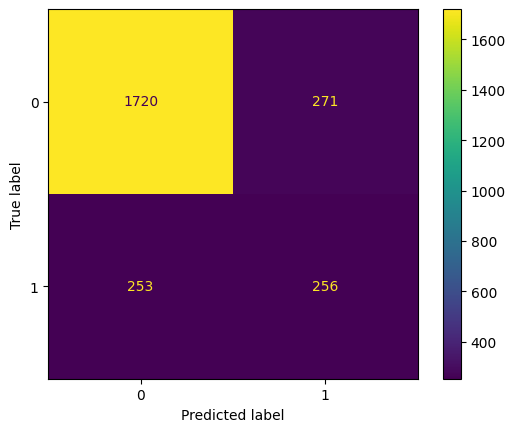

In [132]:
# Generate confusion matrix
conf_matrix_plot(decision_tree, X_test, y_test)

Notice from this confusion matrix that the model correctly predicts many true negatives. Of course,
 this is to be expected, given that the dataset is imbalanced in favor of negatives. When the model
 makes an error, it appears slightly more likely to predict a false positive than a false negative, but
 it’s generally balanced. This is reflected in the precision and recall scores both being very close to
 each other.

 **Plotting the tree** Next, let’s examine the splits of the tree. We’ll do this by using the
 plot_tree() function that we imported. We pass to it our fit model as well as some additional
 parameters. Note that if we did not set max_depth=2, the function would return a plot of the
 entire tree, all the way down to the leaf nodes. This is intractable and unnecessary. We’re most
 interested in the splits nearest the root, because these tell us the most predictive features.

 class_names displays what the majority class of each node is, and filled colors the nodes accord
ing to their majority class.

 Note that this plot represents how the tree grew from the training data. To make its predictions
 on the test data, the tree would simply pass each customer in the test data through its splits, from
 the root node all the way down to a leaf node.

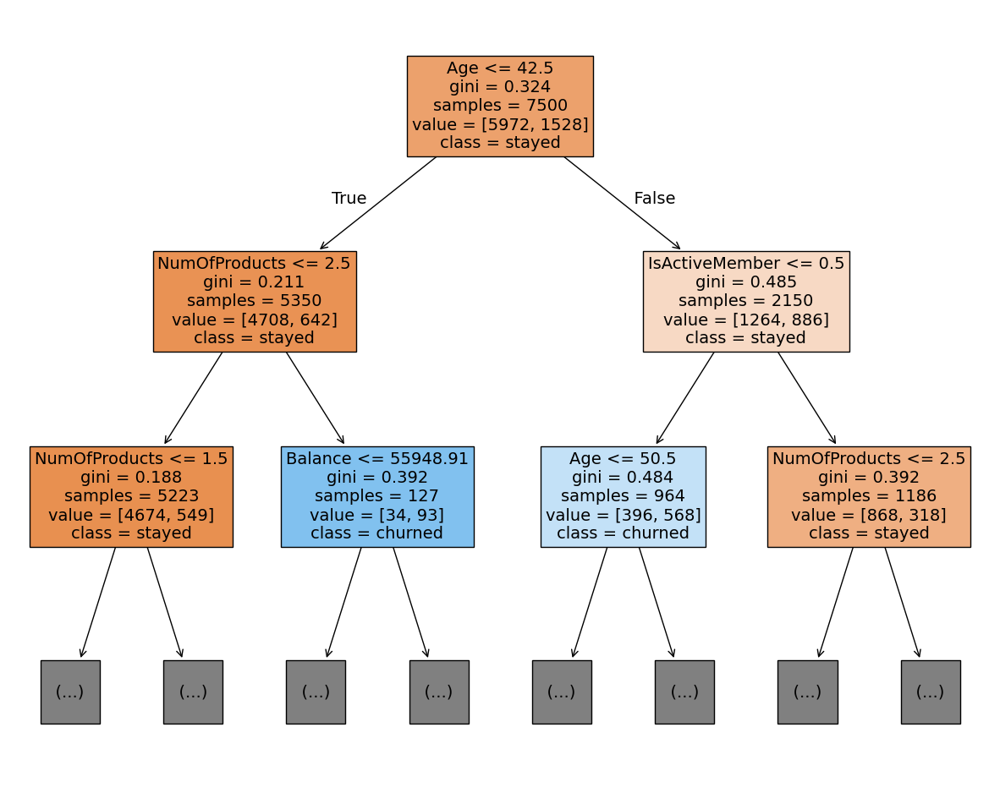

In [133]:
# Plot the tree
plt.figure(figsize=(15,12))
plot_tree(decision_tree, max_depth=2, fontsize=14, feature_names=X.columns,
          class_names={0:'stayed', 1:'churned'}, filled=True);
plt.show()

How do we read this plot? The first line of information in each node is the feature and split point
 that the model identified as being most predictive. In other words, this is the question that is being
 asked at that split. For our root node, the question was: Is the customer less than or equal to 42.5
 years old?

 At each node, if the answer to the question it asks is “yes,” the sample would move to the child
 node on the left. If the answer is “no,” the sample would go to the child node on the right.
 gini refers to the node’s Gini impurity. This is a way of measuring how “pure” a node is. The
 value can range from 0 to 0.5. A Gini score of 0 means there is no impurity—the node is a leaf, and
 all of its samples are of a single class. A score of 0.5 means the classes are all equally represented
 in that node.

 samples is simply how many samples are in that node, and value indicates how many of each
 class are in the node. Returning to the root node, we have value = [5972, 1528]. Notice that
 these numbers sum to 7,500, which is the number of samples in the node. This tells us that 5,972
 customers in this node stayed (y=0) and 1,528 customers churned (y=1).

 Lastly, we have class. This tells us the majority class of the samples in each node.

 This plot tells us that, if we could only do a single split on a single variable, the one that would
 most help us predict whether a customer will churn is their age.

 If we look at the nodes at depth one, we notice that the number of products and whether or not
 the customer is an active member also are both strong predictors (relative to the features we have)
 of whether or not they will churn.
 This is a good indication that it might be worthwhile to return to your EDA and examine these
 features more closely.
 Finally, it’s worth noting that there is no single question that can be asked—for any feature—that
 would cause a majority of samples in one of the child nodes to be of class “churned.” The tree must
 get to depth two (i.e., two questions must be asked) before this happens.
 If you have successfully completed the material above, congratulations! You now understand how
 to use Python to construct and interpret a decision tree model. Going forward, you can start using
 Python to build decision trees with your own data.
 #Tune and validate decision trees with Python
 Important: This part of the notebook corresponds with the “Tune and validate decision trees
 with Python” video, but it builds on the code from a previous video. If you have not already done
 so, run all of the preceding cells. You can do this easily by going to “Cell” in the menu at the top
 of the notebook and clicking “Run All Above” in the dropdown menu.
 Throughout the following exercises, you will learn to use Python to tune and cross-validate a
 decision tree model with scikit-learn. Before starting on this programming exercise, we strongly
 recommend watching the video lecture for the associated topics.
 All the information you need for solving this assignment is in this notebook, and all the code you
 will be implementing will take place within this notebook.
 Topics of focus include:
 • Using GridSearchCV to tune the following hyperparameters with cross-validation:– max_depth– min_samples_leaf
 As we move forward, you can find instructions on how to install required libraries as they arise in
 this notebook.

 **1.9 A note on modeling workflow and model selection**

 The tuned decision tree model in this notebook will be referenced in the subsequent notebooks for
 random forest and XGBoost, which model the same data. Because of this, we will build all of our
 models across all of these notebooks, and model selection will take place in the final notebook. The
 champion model will be the one that performs best on the validation data. Only this final model
 will be evaluated using the test data.

 This approach has a limitation. We are using the same data to tune the hyperparameters as we
 are using to perform model selection. This risks potentially overfitting the model to the validation
 data.

 Ideally, with enough time and data, we’d tune the models’ hyperparameters, then score all the
 models on separate validation data and perform model selection based on these scores. Finally, the

champion model would be scored on the test holdout data to get an estimate of how the model can be expected to perform on new, unseen data.

**1.10 Import statements**

 This is a continuation of the notebook for the baseline decision tree model. Refer to (and run) the
 import statements above.
 The only additional import is GridSearchCV from scikit-learn’s model_selection module. This is
 what we’ll use to perform the grid search to tune the model’s hyperparameters.

In [134]:
# Import GridSearchCV
from sklearn.model_selection import GridSearchCV

**Cross-validated hyperparameter tuning**

 Cross-validating a model using GridSearchCV can be done in a number of different ways. If you find
 notebooks online that other people have written, you’ll likely soon discover this for yourself. But all
 variations must fulfill the same general requirements. (Refer to the GridSearchCV documentation
 for further reading.)

 The format presented below is step-wise, making it easier to follow.

 • Create a dictionary of hyperparameters to search over:
    – key = name of hyperparameter (string)
    – value = values to search over (list)

In [135]:
# Assign a dictionary of hyperparameters to search over
tree_para = {'max_depth':[4,5,6,7,8,9,10,11,12,15,20,30,40,50],
             'min_samples_leaf': [2, 5, 10, 20, 50]}

• Create a dictionary of scoring metrics to capture. These metrics can be selected from scikit
learn’s built-in options or custom-defined. For this exercise, we’ll capture accuracy, precision,
 recall, and F1 score so we can examine all of them. The metrics are entered as strings.

In [136]:
# Assign a dictionary of scoring metrics to capture
scoring = {'accuracy': 'accuracy', 'precision': 'precision', 'recall': 'recall', 'f1': 'f1'}
print(type(scoring))

<class 'dict'>


• Instantiate the classifier (and set the random_state)

In [137]:
# Instantiate the classifier
tuned_decision_tree = DecisionTreeClassifier(random_state = 42)

• Instantiate the GridSearchCV object. Pass as arguments:
    – The classifier (tuned_decision_tree)
    
    – The dictionary of hyperparameters to search over (tree_para)
    – The dictionary of scoring metrics (scoring)
    – The number of cross-validation folds you want (cv=5)
    – The scoring metric that you want GridSearch to use when it selects the “best” model (i.e., the model that performs best on average over all validation folds) (refit='f1'*)* The reason it’s called refit is because once the algorithm finds the combination of hyperparameters that results in the best average score across all validation folds, it will then refit this model to all of the training data. Remember, up until now, with a 5-fold cross-validation, the model has only ever been fit on 80% (4/5) of the training data, because the remaining 20% was held out as a validation fold.

• Fit the data (X_train, y_train) to the GridSearchCV object (clf)

Depending on the number of different hyperparameters you choose, the number of combinations you search over, the size of your data, and your available computing resources, this could take a
 long time.    

In [138]:
# Instantiate the GridSearch
clf = GridSearchCV(tuned_decision_tree,
                   tree_para,
                   scoring = scoring,
                   cv=5,
                   refit="f1")

# Fit the model
clf.fit(X_train, y_train)

GridSearchCV(cv=5, estimator=DecisionTreeClassifier(random_state=42),
             param_grid={'max_depth': [4, 5, 6, 7, 8, 9, 10, 11, 12, 15, 20, 30,
                                       40, 50],
                         'min_samples_leaf': [2, 5, 10, 20, 50]},
             refit='f1',
             scoring={'accuracy': 'accuracy', 'f1': 'f1',
                      'precision': 'precision', 'recall': 'recall'})

Now that the model is fit and cross-validated, we can use the best_estimator_ attribute to inspect
the hyperparameter values that yielded the highest F1 score during cross-validation.

In [139]:
# Examine the best model from GridSearch
clf.best_estimator_

DecisionTreeClassifier(max_depth=8, min_samples_leaf=20, random_state=42)

The best_score_ attribute returns the best average F1 score across the different folds among all the
 combinations of hyperparameters. Note that if we had set refit='recall' when we instantiated
 our GridSearchCV object earlier, then calling best_score_ would return the best recall score, and
 the best parameters might not be the same as what they are in the above cell, because the model
 would be selected based on a different metric.

In [140]:
print("Best Avg. Validation Score: ", "%.4f" % clf.best_score_)

Best Avg. Validation Score:  0.5607


Although the F1 score of 0.561 is significantly better than the baseline model’s F1 score of 0.494,
 it’s not a fair comparison, because the baseline model was scored on the test data and the tuned
 model was scored against validation folds that came from the training data.

 Recall that when we ran our grid search, we specified that we also wanted to capture precision,
 recall, and accuracy. The reason for doing this is that it’s difficult to interpret an F1 score. These
 other metrics are much more directly interpretable, so they’re worth knowing.

 The following cell defines a helper function that extracts these scores from the fit GridSearchCV
 object and returns a pandas dataframe with all four scores from the model with the best average
 F1 score during validation. This function will help us later when we want to add the results of
 other models to the table.

In [141]:
def make_results(model_name, model_object):
  '''
  Accepts as arguments a model name (your choice- string) and
  a fit GridSearchCV model object.

  Returns a pandas df with the F1, recall, precision, and accuracy scores
  for the model with the best mean F1 score across all validation folds.
  '''

  # Get all the results from the CV and put them in a df
  cv_results = pd.DataFrame(model_object.cv_results_)

  # Isolate the row of the df with the max(mean f1 score)
  best_estimator_results = cv_results.iloc[cv_results['mean_test_f1'].idxmax(), :]

  # Extract accuracy, precision, recall, and f1 score from that row
  f1 = best_estimator_results.mean_test_f1
  recall = best_estimator_results.mean_test_recall
  precision = best_estimator_results.mean_test_precision
  accuracy = best_estimator_results.mean_test_accuracy

  # Create table of results
  table = pd.DataFrame({'Model': [model_name],
                        'F1': [f1],
                        'Recall': [recall],
                        'Precision': [precision],
                        'Accuracy': [accuracy]
                        }
                       )
  return table

In [142]:
# Call the function on our model
result_table = make_results("Tuned Decision Tree", clf)

We can save these results and open them in another notebook if we want to add to them. We’ll save as a .csv file using to_csv().

In [143]:
# Save results table as csv
result_table.to_csv("Results.csv")

In [144]:
# View the results
result_table

,Model,F1,Recall,Precision,Accuracy
0,Tuned Decision Tree,0.560655,0.469255,0.701608,0.8504


These results show that our model’s performance isn’t great, but it’s not terrible either. Maybe another kind of model will do better…

# Tune and validate decision trees

**1 Decision tree**

Throughout the following exercises, you will learn to construct and interpret a decision tree model
 with scikit-learn. Before starting on this programming exercise, we strongly recommend watching
 the video lecture and completing the IVQ for the associated topics.
 This notebook contains the code used in two instructional videos from Week 4: Tree-based modeling.
 To skip directly to the code for each video, use the following links:

 1. Section ??
 2. Section ??

All the information you need for solving this assignment is in this notebook, and all the code you
 will be implementing will take place within this notebook.
 Topics of focus include:

    • Relevant import statements
    • Selecting an evaluation metric
    • Encoding of categorical features as dummies
    • Stratification during data splitting
    • Fitting a model
    • Model evaluation using precision, recall, and F1 score
     • Plotting the decision tree and examining its splits

As we move forward, you can find instructions on how to install required libraries as they arise in this notebook.

**1.1 Modeling objective**

The modeling objective is to build and test a decision tree model that uses banking data to predict
 whether a customer will churn. If a customer churns, it means they left the bank and took their
 business elsewhere. If we can predict customers who are likely to churn, we can take measures to
 retain them before they do. These measures could be promotions, discounts, or other incentives to
 boost customer satisfaction, and, therefore, retention.

 **1.1.1 Model design and target variable**

 Our data dictionary shows that there is a column called Exited. This is a binary value that
 indicates whether or not a customer left the bank (0 = did not leave, 1 = did leave). This will
 be our target variable. In other words, for each customer, our model should predict whether they
 should have a 0 or a 1 in the Exited column.
 This is a classification task, because we are trying to predict on a binary class. Therefore, we will
 use a DecisionTreeClassifier model.
 1.1.2 A note on modeling workflow and model selection

 This notebook is used together with other notebooks in this course that model the same data.
 Because of this, we will build all of our models across all of these notebooks, and model selection
 will take place in the final notebook. The champion model will be the one that performs best on
 the validation data. Only this final model will be evaluated using the test data.
 This approach has a limitation. We are using the same data to tune the hyperparameters as we
 are using to perform model selection. This risks potentially overfitting the model to the validation
 data.

 Ideally, with enough time and data, we’d tune the models’ hyperparameters, then score all the
 models on separate validation data and perform model selection based on these scores. Finally, the
 champion model would be scored on the test holdout data to get an estimate of how the model can
 be expected to perform on new, unseen data.

 *Build a decision tree with Python

**1.2 Import statements**

 Before we begin with the exercises and analyzing the data, we need to import all libraries and
 extensions required for this programming exercise. Throughout the course, we will be using numpy
 and pandas for operations, and matplotlib for plotting.

In [145]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier

# This function displays the splits of the tree
from sklearn.tree import plot_tree
from sklearn.metrics import ConfusionMatrixDisplay, confusion_matrix
from sklearn.metrics import recall_score, precision_score, f1_score, accuracy_score

**1.3 Read in the data**

In [146]:
# Read in data
file = 'Churn_Modelling.csv'
df_original = pd.read_csv(file)
df_original.head()

,RowNumber,CustomerId,Surname,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited
0,1,15634602,Hargrave,619,France,Female,42,2,0.00,1,1,1,101348.88,1
1,2,15647311,Hill,608,Spain,Female,41,1,83807.86,1,0,1,112542.58,0
2,3,15619304,Onio,502,France,Female,42,8,159660.80,3,1,0,113931.57,1
3,4,15701354,Boni,699,France,Female,39,1,0.00,2,0,0,93826.63,0
4,5,15737888,Mitchell,850,Spain,Female,43,2,125510.82,1,1,1,79084.10,0


**1.4 Examine the data**

 At this point in a typical data science project, you’d do a thorough exploratory data analysis (EDA)
 to better understand your data and what it’s telling you. For the purposes of this lab, we will skip
 this.

 In the steps that follow, we’ll perform many of the same steps that we took to build our Naive
 Bayes model. We’ll redo them here to review them for good measure.

 We’ll begin by checking the balance of the classes in our target variable (Exited), as this will help
 us determine how to prepare our data. It will also inform our decision of what evaluation metric
 to use to select our final model.

In [147]:
# Check class balance
df_original['Exited'].value_counts()

,count
Exited,
0,7963
1,2037


The class of our target variable is split roughly 80/20. In other words, ~20% of the people in this
 dataset churned. This is an unbalanced dataset, but it’s not extreme. We will preserve this ratio
 when we model.

**1.5 Select an evaluation metric**

The data contains 10,000 observations, and the class distribution is approximately 80/20.

Since we have some imbalance in our target classes, we know that if we measure model performance
 by accuracy alone, the model could predict 0 (no churn) 100% of the time and have an accuracy
 of ~80%. An accuracy of 80% might seem pretty good, but we know in this case it would be
 meaningless, because our model would fail to identify anybody who churned.

 Therefore, accuracy
 is not the best metric to use to evaluate our model’s performance.
 To determine which evaluation metric might be best, consider how our model might be wrong.
 There are two possibilities for bad predictions:

    • False positives: When the model predicts a customer will churn when in fact they won’t
    • False negatives: When the model predicts a customer will not churn when in fact they will

 As you know, there are a number of performance metrics aside from accuracy to choose from. Some
 of these include precision, recall, and F1 score. Let’s examine these more closely, beginning with
 precision:

precision = (TP) / (FP + TP)

And *recall:

recall = TP / (FN / TP)

Refer to the confusion matrix for a reminder on what the terms represent.

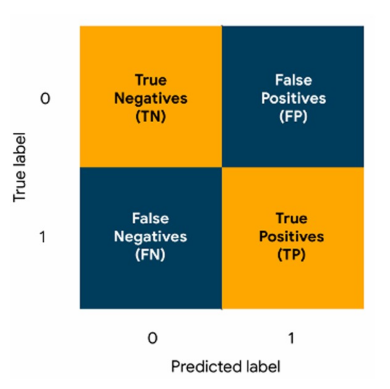

In [148]:
# Show imagen
plt.imshow(cm)
plt.axis('off') # Hide the axes
plt.show()

Precision represents the percentage of all our model’s predicted positives that are true positives.
 This might not be the best metric for us to use, because it disincentivizes predicting someone will
 churn unless there is a high degree of certainty that they will. This could translate to a high rate
 of false negatives.

 On the other hand, recall represents the percentage of all actual positives that the model identifies
 as such. This also might not be the best metric to use, because it rewards predicting someone will
 churn even if the likelihood of their doing so is very small. This could translate to a high rate of
 false positives.

 So which is worse, false positives or false negatives? Well, we’d first have to define what worse
 means. This is dependent on the details of the project that you’re working on. For the sake of this
 exercise, let us suppose that we’re defining it as the error that would cost the bank more money.

 We can quickly get an idea of how much money each customer who churns costs the bank by
 calculating the average balance of all customers who churned.

In [149]:
# Calculate average balance of customers who churned
avg_churned_bal = df_original[df_original['Exited']==1]['Balance'].mean()
avg_churned_bal

np.float64(91108.53933726068)

This shows that the customers who churned each took with them €91,108.54, on average. That’s
 a lot of money! This represents the average cost of the model predicting a false negative.

 What’s the cost of predicting a false positive? Well, it’s the cost of whatever the incentive might
 be to convince someone to stay with the bank when they were going to stay regardless of whether
 or not they were incentived. We don’t have a number for this, and even if it’s probably less than
 €91,108.54, it still could be thousands of Euros per customer in lost revenue, depending on the
 details of the incentive.

 Since correctly identifying customers who will churn is potentially very valuable, we could select
 recall as our most important metric. This might be a perfectly valid approach, depending on the
 specifics of the campaign. But this could also be problematic. After all, if we select a model based
 solely on recall, we could select a very biased model that predicts everyone to churn, but then 8,000
 people would be given incentives needlessly.

 Since we don’t know the exact cost of predicting a false negative, we’ll make an assumption for this
 exercise. We’ll assume that a metric that balances precision and recall is best. The metric that
 helps us achieve this balance is F1 score, which is defined as the harmonic mean of precision and

 F1 = 2 x (precision * recall) / (precision + recall)

 Again, there are many metrics to choose from. The important thing is that you make an informed
 decision that is based on your use case.
 Now that we’ve decided on an evaluation metric, let’s prepare the data for modeling.

 **1.6 Feature engineering**

 **1.6.1 Feature selection**

 In this step, we’ll prepare the data for modeling. These are the same steps as what we did for the
 Naive Bayes model. For more thorough explanation of this process, refer to the Feature Engineering
 notebook from Module 3. Note that for time considerations, we won’t create any new features.

 We begin by dropping the columns that we wouldn’t expect to offer any predictive signal to the
 model. These columns include RowNumber, CustomerID, and Surname. We’ll drop these columns
 so they don’t introduce noise to our model.

 We’ll also drop the Gender column, because we don’t want our model to make predictions based
 on gender.

In [150]:
# Create a new df that drops RowNumber, CustomerId, Surname, and Gender cols
churn_df = df_original.drop(['RowNumber', 'CustomerId', 'Surname', 'Gender'], axis=1)
churn_df.head()

,CreditScore,Geography,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited
0,619,France,42,2,0.00,1,1,1,101348.88,1
1,608,Spain,41,1,83807.86,1,0,1,112542.58,0
2,502,France,42,8,159660.80,3,1,0,113931.57,1
3,699,France,39,1,0.00,2,0,0,93826.63,0
4,850,Spain,43,2,125510.82,1,1,1,79084.10,0


 **1.6.2 Feature transformation**

 Next, we’ll dummy encode the Geography variable, which is categorical. There are three possible
 categories captured here: France, Spain, and Germany. When we call pd.get_dummies() on this
 feature, it will replace the Geography column with three new Boolean columns–one for each possible
 category contained in the column being dummied.

 When we specify drop_first='True' in the function call, it means that instead of replacing
 Geography with three new columns, it will instead replace it with two columns. We can do this
 because no information is lost from this, but the dataset is shorter and simpler.

 In this case, we end up with two new columns called Geography_Germany and Geography_Spain.
 We don’t need a Geography_France column. Why not? Because if a customer’s values in
 Geography_Germany and Geography_Spain are both 0, we’ll know they’re from France!

In [152]:
# Dummy encode categorical variables
churn_df = pd.get_dummies(churn_df, drop_first=True)
churn_df.head()

,CreditScore,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited,Geography_Germany,Geography_Spain
0,619,42,2,0.00,1,1,1,101348.88,1,False,False
1,608,41,1,83807.86,1,0,1,112542.58,0,False,True
2,502,42,8,159660.80,3,1,0,113931.57,1,False,False
3,699,39,1,0.00,2,0,0,93826.63,0,False,False
4,850,43,2,125510.82,1,1,1,79084.10,0,False,True


**1.7 Split the data**

 It’s time to split the data into features and target variable, and into training data and test data.
 We do this using the train_test_split() function. We’ll put 25% of the data into our test set,
 and use the remaining 75% to train the model.

 Don’t forget to include the stratify=y parameter, as this is what ensures that the 80/20 class
 ratio of the target variable is maintained in both the training and test datasets after splitting.

 Lastly, we set a random seed so we and others can reproduce our work.

In [153]:
# Define the y (target) variable
y = churn_df['Exited']

# Define the X (predictor) variables
X = churn_df.copy()
X = X.drop('Exited', axis=1)

# Split into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                    test_size=0.25, stratify=y,
                                                    random_state=42)

**1.8 Baseline model**

 We’ll first train a baseline model, just to get a sense of how predictive the data is and to give us
 scores that we can reference later.
 This will also show the process of instantiating and fitting the
 model, and then using it to make predictions. We’ll predict on the test data.

In [154]:
# Instantiate the model
decision_tree = DecisionTreeClassifier(random_state=0)

# Fit the model to training data
decision_tree.fit(X_train, y_train)

# Make predictions on test data
dt_pred = decision_tree.predict(X_test)

In [155]:
# Generate performance metrics
print("Accuracy:", "%.3f" % accuracy_score(y_test, dt_pred))
print("Precision:", "%.3f" % precision_score(y_test, dt_pred))
print("Recall:", "%.3f" % recall_score(y_test, dt_pred))
print("F1 Score:", "%.3f" % f1_score(y_test, dt_pred))

Accuracy: 0.790
Precision: 0.486
Recall: 0.503
F1 Score: 0.494


A comparison of F1 scores reveals that the decision tree is an improvement to the Naive Bayes model we built earlier. For reference, here are the scores of both models:



| Model | F1 | Recall | Precision | Accurancy |
|---|---|---|---|---|
| Decision Tree | 0.494 | 0.503 | 0.486 | 0.790 |
| NaiveBayes | 0.456 | 0.369 | 0.597 | 0.821 |

**1.8.1 Analysis of baseline model**

Confusion matrix Let’s inspect the confusion matrix of our decision tree’s predictions. First, we’ll write a short helper function to help us display the matrix.

In [156]:
def conf_matrix_plot(model, x_data, y_data):
 '''
 Accepts as argument model object, X data (test or validate), and y data␣ (test or validate).
 Returns a plot of confusion matrix for predictions on y data.
 '''
 model_pred = model.predict(x_data)
 cm = confusion_matrix(y_data, model_pred, labels=model.classes_)
 disp = ConfusionMatrixDisplay(confusion_matrix=cm,
                               display_labels=model.classes_)

 disp.plot(values_format='') # `values_format=''` suppresses scientific notation
 plt.show()

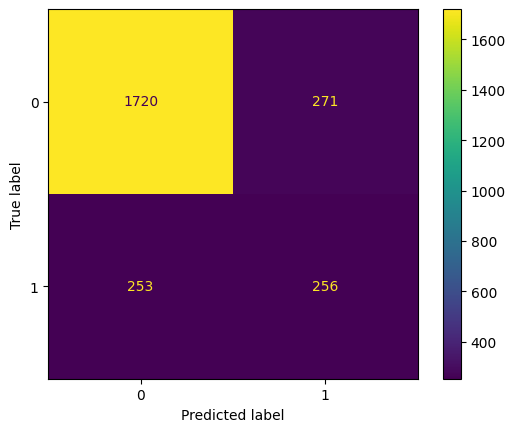

In [157]:
# Generate confusion matrix
conf_matrix_plot(decision_tree, X_test, y_test)

Notice from this confusion matrix that the model correctly predicts many true negatives. Of course,
 this is to be expected, given that the dataset is imbalanced in favor of negatives. When the model
 makes an error, it appears slightly more likely to predict a false positive than a false negative, but
 it’s generally balanced. This is reflected in the precision and recall scores both being very close to
 each other.

 Plotting the tree Next, let’s examine the splits of the tree. We’ll do this by using the
 plot_tree() function that we imported. We pass to it our fit model as well as some additional
 parameters. Note that if we did not set max_depth=2, the function would return a plot of the
 entire tree, all the way down to the leaf nodes. This is intractable and unnecessary. We’re most
 interested in the splits nearest the root, because these tell us the most predictive features.

 class_names displays what the majority class of each node is, and filled colors the nodes accord
ing to their majority class.

 Note that this plot represents how the tree grew from the training data. To make its predictions
 on the test data, the tree would simply pass each customer in the test data through its splits, from
 the root node all the way down to a leaf node.

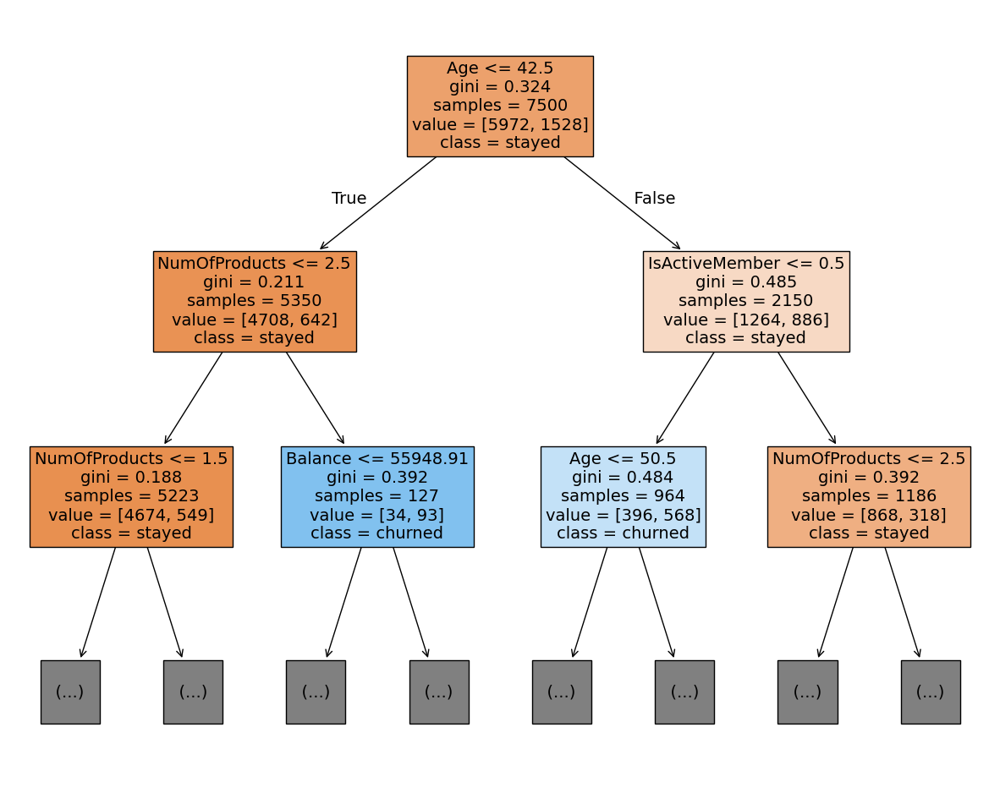

In [158]:
# Plot the tree
plt.figure(figsize=(15,12))
plot_tree(decision_tree, max_depth=2, fontsize=14, feature_names=X.columns,
class_names={0:'stayed', 1:'churned'}, filled=True);
plt.show()

How do we read this plot? The first line of information in each node is the feature and split point
 that the model identified as being most predictive. In other words, this is the question that is being
 asked at that split. For our root node, the question was: Is the customer less than or equal to 42.5
 years old?

 At each node, if the answer to the question it asks is “yes,” the sample would move to the child
 node on the left. If the answer is “no,” the sample would go to the child node on the right.
 gini refers to the node’s Gini impurity. This is a way of measuring how “pure” a node is. The
 value can range from 0 to 0.5. A Gini score of 0 means there is no impurity—the node is a leaf, and
 all of its samples are of a single class. A score of 0.5 means the classes are all equally represented
 in that node.

 samples is simply how many samples are in that node, and value indicates how many of each
 class are in the node. Returning to the root node, we have value = [5972, 1528]. Notice that
 these numbers sum to 7,500, which is the number of samples in the node. This tells us that 5,972
 customers in this node stayed (y=0) and 1,528 customers churned (y=1).

 Lastly, we have class. This tells us the majority class of the samples in each node.

 This plot tells us that, if we could only do a single split on a single variable, the one that would
 most help us predict whether a customer will churn is their age.

 If we look at the nodes at depth one, we notice that the number of products and whether or not
 the customer is an active member also are both strong predictors (relative to the features we have)
 of whether or not they will churn.

 This is a good indication that it might be worthwhile to return to your EDA and examine these
 features more closely.

 Finally, it’s worth noting that there is no single question that can be asked—for any feature—that
 would cause a majority of samples in one of the child nodes to be of class “churned.” The tree must
 get to depth two (i.e., two questions must be asked) before this happens.
 #Tune and validate decision trees with Python

 **Important:** This part of the notebook corresponds with the “Tune and validate decision trees
 with Python” video, but it builds on the code from a previous video. If you have not already done
 so, run all of the preceding cells. You can do this easily by going to “Cell” in the menu at the top
 of the notebook and clicking “Run All Above” in the dropdown menu.

 Throughout the following exercises, you will learn to use Python to tune and cross-validate a
 decision tree model with scikit-learn. Before starting on this programming exercise, we strongly
 recommend watching the video lecture and completing the IVQ for the associated topics.

 All the information you need for solving this assignment is in this notebook, and all the code you
 will be implementing will take place within this notebook.
 Topics of focus include:

    • Using GridSearchCV to tune the following hyperparameters with cross-validation:– max_depth– min_samples_leaf

 As we move forward, you can find instructions on how to install required libraries as they arise in
 this notebook.

**1.9 A note on modeling workflow and model selection**

 The tuned decision tree model in this notebook will be referenced in the subsequent notebooks for
 random forest and XGBoost, which model the same data. Because of this, we will build all of our
 models across all of these notebooks, and model selection will take place in the final notebook. The
 champion model will be the one that performs best on the validation data. Only this final model
 will be evaluated using the test data.

 This approach has a limitation. We are using the same data to tune the hyperparameters as we
 are using to perform model selection. This risks potentially overfitting the model to the validation
 data.

 Ideally, with enough time and data, we’d tune the models’ hyperparameters, then score all the
 models on separate validation data and perform model selection based on these scores. Finally, the
 champion model would be scored on the test holdout data to get an estimate of how the model can
 be expected to perform on new, unseen data.

 **1.10 Import statements**

 This is a continuation of the notebook for the baseline decision tree model. Refer to the import
 statements above.

 The only additional import is GridSearchCV from scikit-learn’s model_selection module. This is
 what we’ll use to perform the grid search to tune the model’s hyperparameters.

In [159]:
# Import GridSearchCV
from sklearn.model_selection import GridSearchCV

**Cross-validated hyperparameter tuning**

 Cross-validating a model using GridSearchCV can be done in a number of different ways. If you find
 notebooks online that other people have written, you’ll likely soon discover this for yourself. But all
 variations must fulfill the same general requirements. (Refer to the GridSearchCV documentation
 for further reading.)
 The format presented below is step-wise, making it easier to follow.
    
    • Instantiate the classifier (and set the random_state)

In [160]:
# Instantiate the classifier
tuned_decision_tree = DecisionTreeClassifier(random_state = 42)

    • Create a dictionary of hyperparameters to search over:
    – key = name of hyperparameter (string)
    – value = values to search over (list)

In [161]:
# Assign a dictionary of hyperparameters to search over
tree_para = {'max_depth':[4,5,6,7,8,9,10,11,12,15,20,30,40,50],
             'min_samples_leaf': [2, 5, 10, 20, 50]}

 • Create a set of scoring metrics to capture. These metrics can be selected from scikit-learn’s
 built-in options or custom-defined. For this exercise, we’ll capture accuracy, precision, recall,
 and F1 score so we can examine all of them. The metrics are entered as strings.

In [168]:
# Assign a dictionary of scoring metrics to capture
scoring = {'accuracy': 'accuracy', 'precision': 'precision', 'recall': 'recall', 'f1': 'f1'}

 • Instantiate the GridSearchCV object. Pass as arguments:

    – The classifier (tuned_decision_tree)
    – The dictionary of hyperparameters to search over (tree_para)
    – The set of scoring metrics (scoring)
    – The number of cross-validation folds you want (cv=5)
    – The scoring metric that you want GridSearch to use when it selects the “best” model
    (i.e., the model that performs best on average over all validation folds) (refit='f1'*)
    
* The reason it’s called refit is because once the algorithm finds the combination of hyperparameters that results in the best average score across all validation folds, it will then refit this model to all of the training data. Remember, up until now, with a 5-fold.   cross-validation, the model has only ever been fit on 80% (4/5) of the training data,
 because the remaining 20% was held out as a validation fold.

 • Fit the data (X_train, y_train) to the GridSearchCV object (clf) Depending on the number of different hyperparameters you choose, the number of combinations you search over, the size of your data, and your available computing resources, this could take a
 long time.

In [169]:
%%time
# Instantiate the GridSearch
clf = GridSearchCV(tuned_decision_tree,
                   tree_para,
                   scoring = scoring,
                   cv=5,
                   refit="f1")

# Fit the model
clf.fit(X_train, y_train)

CPU times: user 17.8 s, sys: 97.8 ms, total: 17.9 s
Wall time: 17.7 s


GridSearchCV(cv=5, estimator=DecisionTreeClassifier(random_state=42),
             param_grid={'max_depth': [4, 5, 6, 7, 8, 9, 10, 11, 12, 15, 20, 30,
                                       40, 50],
                         'min_samples_leaf': [2, 5, 10, 20, 50]},
             refit='f1',
             scoring={'accuracy': 'accuracy', 'f1': 'f1',
                      'precision': 'precision', 'recall': 'recall'})

Now that the model is fit and cross-validated, we can use the best_estimator_ attribute to inspect
 the hyperparameter values that yielded the highest F1 score during cross-validation.

In [170]:
# Examine the best model from GridSearch
clf.best_estimator_

DecisionTreeClassifier(max_depth=8, min_samples_leaf=20, random_state=42)

 The best_score_ attribute returns the best average F1 score across the different folds among all the
 combinations of hyperparameters. Note that if we had set refit='recall' when we instantiated
 our GridSearchCV object earlier, then calling best_score_ would return the best recall score, and
 the best parameters might not be the same as what they are in the above cell, because the model
 would be selected based on a different metric.

In [171]:
print("Best Avg. Validation Score: ", "%.4f" % clf.best_score_)

Best Avg. Validation Score:  0.5607


 Best Avg. Validation Score: 0.5607

 Although the F1 score of 0.561 is significantly better than the baseline model’s F1 score of 0.494,
 it’s not a fair comparison, because the baseline model was scored on the test data and the tuned
 model was scored against validation folds that came from the training data.

 Recall that when we ran our grid search, we specified that we also wanted to capture precision,
 recall, and accuracy. The reason for doing this is that it’s difficult to interpret an F1 score. These
 other metrics are much more directly interpretable, so they’re worth knowing.

 The following cell defines a helper function that extracts these scores from the fit GridSearchCV
 object and returns a pandas dataframe with all four scores from the model with the best average F1 score during validation. This function will help us later when we want to add the results of other models to the table.

In [173]:
def make_results(model_name, model_object):
 '''
 Accepts as arguments a model name (your choice- string) and
 a fit GridSearchCV model object.

 Returns a pandas df with the F1, recall, precision, and accuracy scores
 for the model with the best mean F1 score across all validation folds.
 '''
 # Get all the results from the CV and put them in a df
 cv_results = pd.DataFrame(model_object.cv_results_)

 # Isolate the row of the df with the max(mean f1 score)
 best_estimator_results = cv_results.iloc[cv_results['mean_test_f1'].idxmax(), :]

 # Extract accuracy, precision, recall, and f1 score from that row
 f1 = best_estimator_results.mean_test_f1
 recall = best_estimator_results.mean_test_recall
 precision = best_estimator_results.mean_test_precision
 accuracy = best_estimator_results.mean_test_accuracy

 # Create table of results
 table = pd.DataFrame()

 # Create table of results
 table = pd.DataFrame({'Model': [model_name],
                       'F1': [f1],
                       'Recall': [recall],
                       'Precision': [precision],
                       'Accuracy': [accuracy]
                       }
                      )
 return table

In [174]:
# Call the function on our model
result_table = make_results("Tuned Decision Tree", clf)

We can save these results and open them in another notebook if we want to add to them. We’ll save as a .csv file using to_csv().

In [175]:
# Save table as csv
result_table.to_csv("Results.csv")

In [176]:
# View the results
result_table

,Model,F1,Recall,Precision,Accuracy
0,Tuned Decision Tree,0.560655,0.469255,0.701608,0.8504


These results show that our model’s performance isn’t great, but it’s not terrible either. Maybe another kind of model will do better…